In [2]:
import os
import glob
from nilearn import image
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import nibabel as nib
from nilearn import plotting
from nilearn import datasets
import scipy.io
from scipy import stats
from copy import deepcopy
import time
import nibabel as nib
import sklearn
import nibabel
from nibabel import processing
import matplotlib.colors as colors
from scipy import stats
import random
import pandas as pd
from nilearn import datasets
from nilearn.glm import cluster_level_inference
from scipy.stats import pearsonr
from scipy.stats import spearmanr
from sklearn.preprocessing import MinMaxScaler
from nilearn.glm import threshold_stats_img
from nilearn.reporting import get_clusters_table
from nilearn.glm.second_level import SecondLevelModel
from nilearn.image import index_img
from nilearn import image, masking
from scipy.ndimage import label
clustsim_z_thresh = 3.227 #corresponding to two-sided corrected alpha = 0.1, uc p = .001
clustsim_clust_thresh = 30
visualize_z_thresh = 1.96 #corresponding to two-sided uncorrected alpha = 0.05

# read in GLM maps

/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/img_plotting.py:1416: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  safe_get_data(stat_map_img, ensure_finite=True),
/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_stat_map.py:208: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



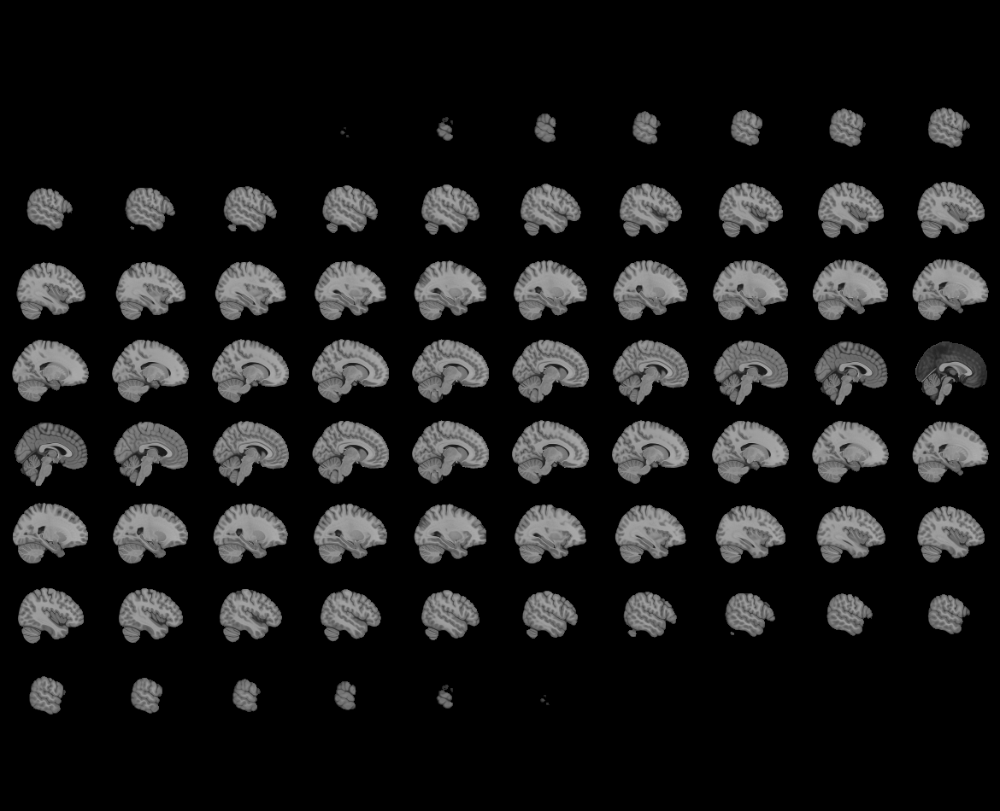
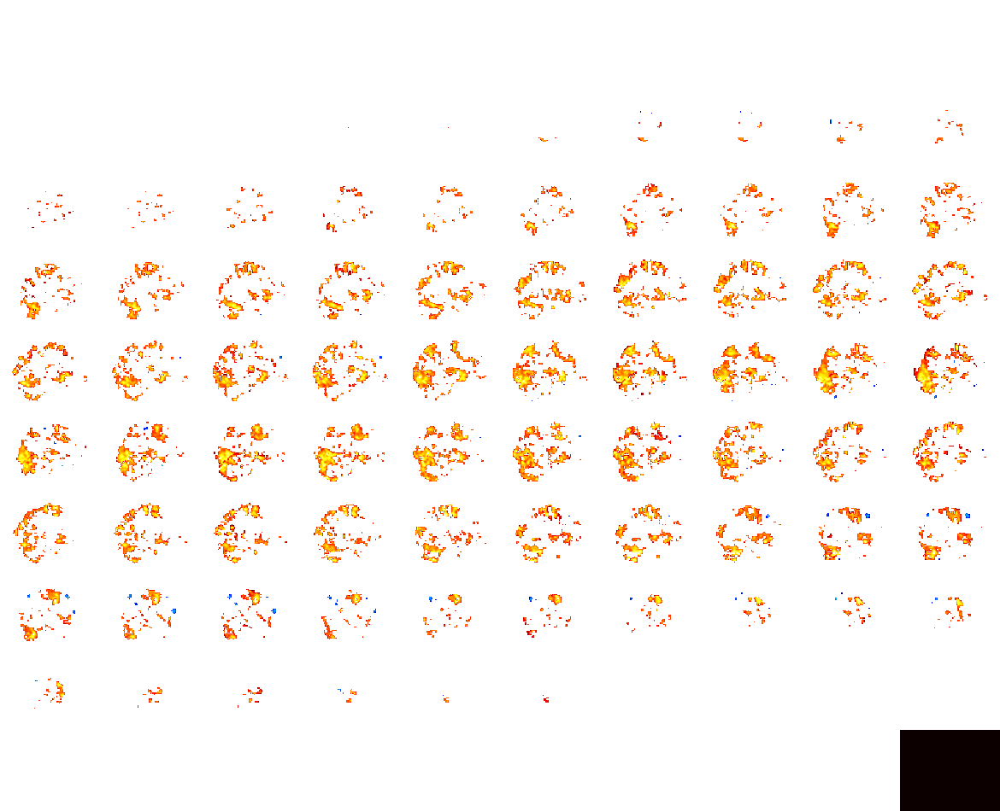

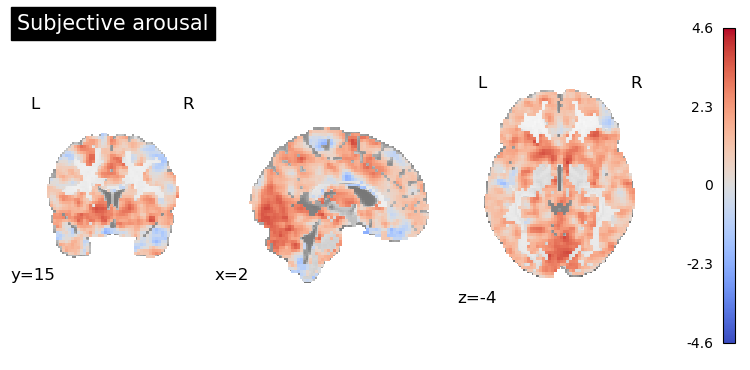

In [3]:
file='./model27c_param_arous_early_30z.nii.gz'
glm27_func_nii = nib.load(file)
affine = glm27_func_nii.affine
glm27_func_data = glm27_func_nii.get_fdata()
glm27_func_data=glm27_func_data[:,:,:,0,1]
glm27_func_data[np.round(glm27_func_data,17)==0]=np.nan #deal with 0s
glm27_func_nii = nib.Nifti1Image(glm27_func_data,affine)  # Create the volume image.

plotting.plot_stat_map(glm27_func_nii, title="Subjective arousal", 
                                 display_mode="ortho", 
                       cmap="coolwarm",
                       cut_coords = (2,15,-4), draw_cross = False)

plotting.view_img(glm27_func_nii,threshold = visualize_z_thresh)

/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_stat_map.py:208: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



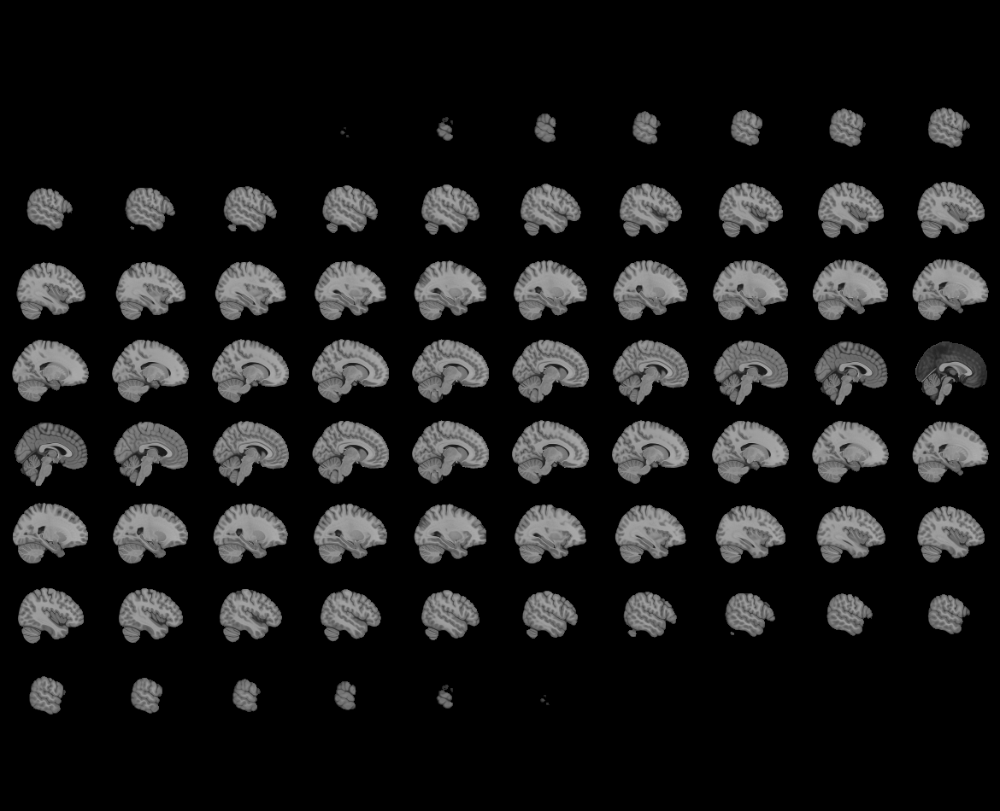
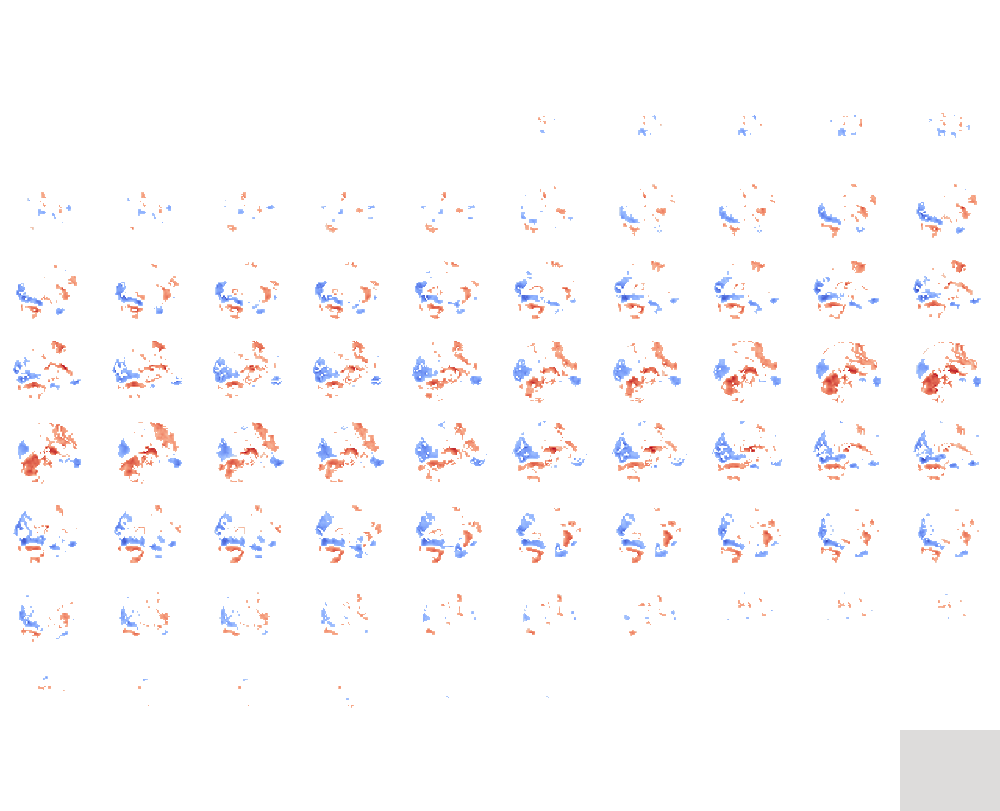

In [4]:
file='./model33b_pupil_scaled_convolved_24z.nii.gz'
glm33b_func_nii = nib.load(file)
affine = glm33b_func_nii.affine
glm33b_func_data = glm33b_func_nii.get_fdata()
glm33b_func_data=glm33b_func_data[:,:,:,0,1]
glm33b_func_data[np.round(glm33b_func_data,17)==0]=np.nan
glm33b_func_nii = nib.Nifti1Image(glm33b_func_data,affine)  # Create the volume image.


plotting.view_img(glm33b_func_nii, title="Convolved pupil", 
                       cmap="coolwarm", threshold = 2,
                       cut_coords = (2,15,-4), draw_cross = False)

# pupil_z_map= nib.load("./second_level_cluster_corrected_pupil_zmap.nii.gz")
# plotting.plot_stat_map(pupil_z_map, title="Convolved pupil", 
#                                  display_mode="ortho", 
#                        cmap="coolwarm", threshold = clustsim_thresh,vmin = -5,vmax = 5,
#                        cut_coords = (2,15,-10), draw_cross = False)

# plotting.plot_glass_brain(glm33b_func_nii, threshold = 2, colorbar=True,plot_abs=False,title="Convolved pupil")


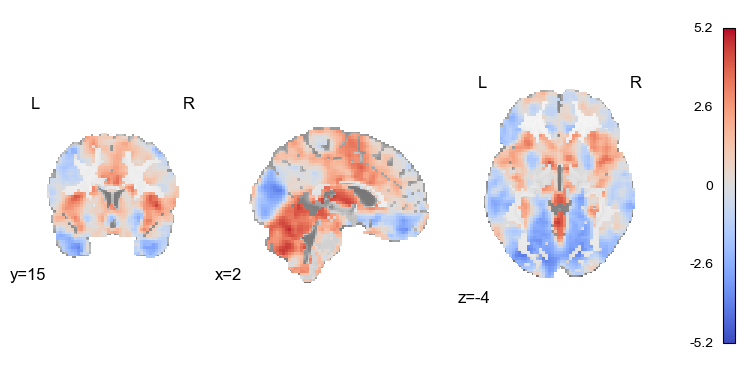

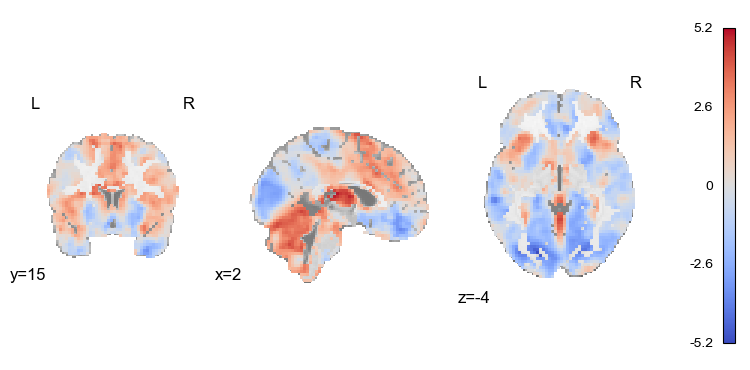

In [16]:
file='./model33b_pupil_scaled_convolved_runs12_24z.nii.gz'
glm33b_h1_func_nii = nib.load(file)
affine = glm33b_h1_func_nii.affine
glm33b_h1_func_data = glm33b_h1_func_nii.get_fdata()
glm33b_h1_func_data=glm33b_h1_func_data[:,:,:,0,1]
glm33b_h1_func_data[np.round(glm33b_h1_func_data,17)==0]=np.nan
glm33b_h1_func_nii = nib.Nifti1Image(glm33b_h1_func_data,affine)  # Create the volume image.

file='./model33b_pupil_scaled_convolved_runs34_24z.nii.gz'
glm33b_h2_func_nii = nib.load(file)
glm33b_h2_func_data = glm33b_h2_func_nii.get_fdata()
glm33b_h2_func_data=glm33b_h2_func_data[:,:,:,0,1]
glm33b_h2_func_data[np.round(glm33b_h2_func_data,17)==0]=np.nan
glm33b_h2_func_nii = nib.Nifti1Image(glm33b_h2_func_data,affine)  # Create the volume image.

plotting.plot_stat_map(glm33b_h1_func_nii,
                                 display_mode="ortho", 
                       cmap="coolwarm",
                       cut_coords = (2,15,-4), draw_cross = False)
plotting.plot_stat_map(glm33b_h2_func_nii,
                                 display_mode="ortho", 
                       cmap="coolwarm",
                       cut_coords = (2,15,-4), draw_cross = False)

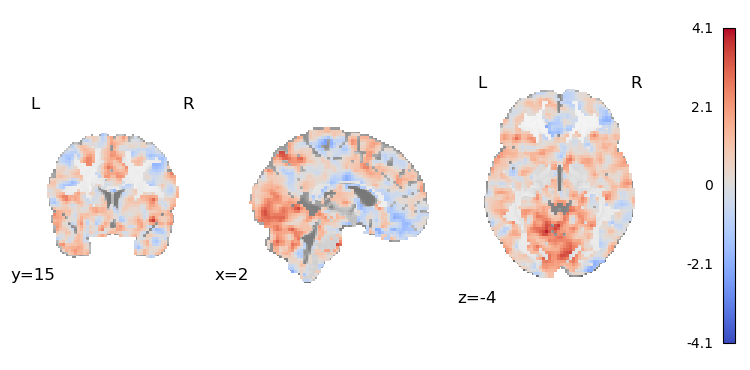

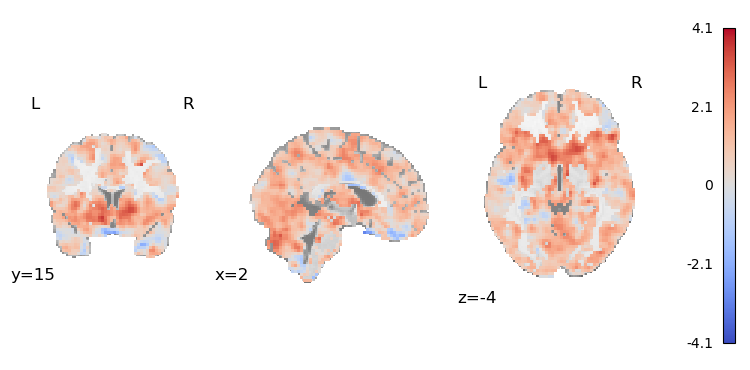

In [6]:
file='./model27c_param_arous_early_runs12_24z.nii.gz'
glm27c_h1_func_nii = nib.load(file)
affine = glm27c_h1_func_nii.affine
glm27c_h1_func_data = glm27c_h1_func_nii.get_fdata()
glm27c_h1_func_data=glm27c_h1_func_data[:,:,:,0,1]
glm27c_h1_func_data[np.round(glm27c_h1_func_data,17)==0]=np.nan
glm27c_h1_func_nii = nib.Nifti1Image(glm27c_h1_func_data,affine)  # Create the volume image.

file='./model27c_param_arous_early_runs34_24z.nii.gz'
glm27c_h2_func_nii = nib.load(file)
glm27c_h2_func_data = glm27c_h2_func_nii.get_fdata()
glm27c_h2_func_data=glm27c_h2_func_data[:,:,:,0,1]
glm27c_h2_func_data[np.round(glm27c_h2_func_data,17)==0]=np.nan
glm27c_h2_func_nii = nib.Nifti1Image(glm27c_h2_func_data,affine)  # Create the volume image.

plotting.plot_stat_map(glm27c_h1_func_nii,
                                 display_mode="ortho", 
                       cmap="coolwarm",
                       cut_coords = (2,15,-4), draw_cross = False)
plotting.plot_stat_map(glm27c_h2_func_nii,
                                 display_mode="ortho", 
                       cmap="coolwarm",
                       cut_coords = (2,15,-4), draw_cross = False)

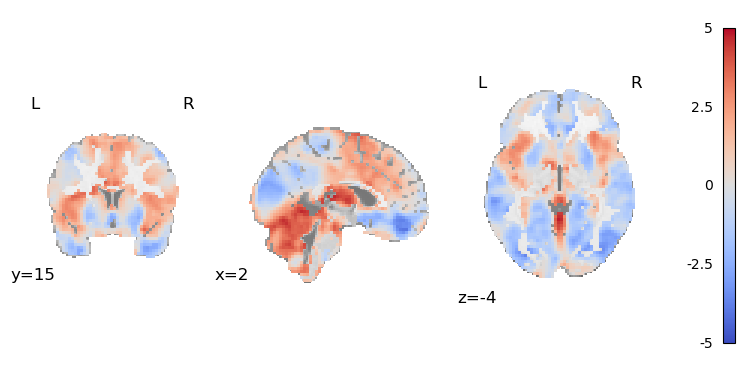

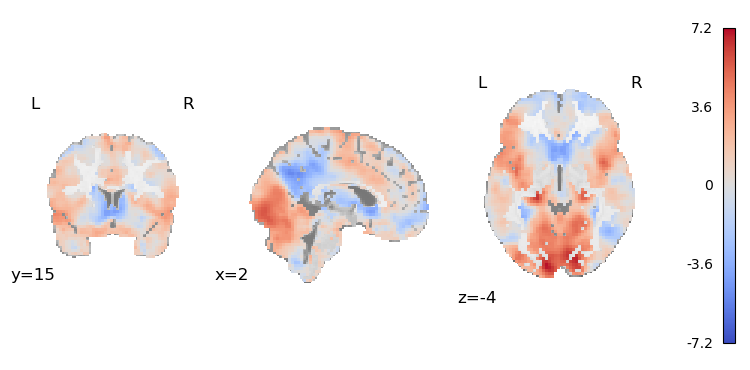

In [7]:
# luminance-controlled
file='./model33bb_pupil_scaled_convolved_24z.nii.gz'
glm33bb_func_nii = nib.load(file)
affine = glm33bb_func_nii.affine
glm33bb_func_data = glm33bb_func_nii.get_fdata()
glm33bb_func_data=glm33bb_func_data[:,:,:,0,1]
glm33bb_func_data[np.round(glm33bb_func_data,17)==0]=np.nan
glm33bb_func_nii = nib.Nifti1Image(glm33bb_func_data,affine)  # Create the volume image.

file='./model33bb_luminance_24z.nii.gz'
luminance_func_nii = nib.load(file)
luminance_func_data = luminance_func_nii.get_fdata()
luminance_func_data=luminance_func_data[:,:,:,0,1]
luminance_func_data[np.round(luminance_func_data,17)==0]=np.nan
luminance_func_nii = nib.Nifti1Image(luminance_func_data,affine)  # Create the volume image.

plotting.plot_stat_map(glm33bb_func_nii,
                                 display_mode="ortho", 
                       cmap="coolwarm",
                       cut_coords = (2,15,-4), draw_cross = False)

plotting.plot_stat_map(luminance_func_nii,
                                 display_mode="ortho", 
                       cmap="coolwarm",
                       cut_coords = (2,15,-4), draw_cross = False)

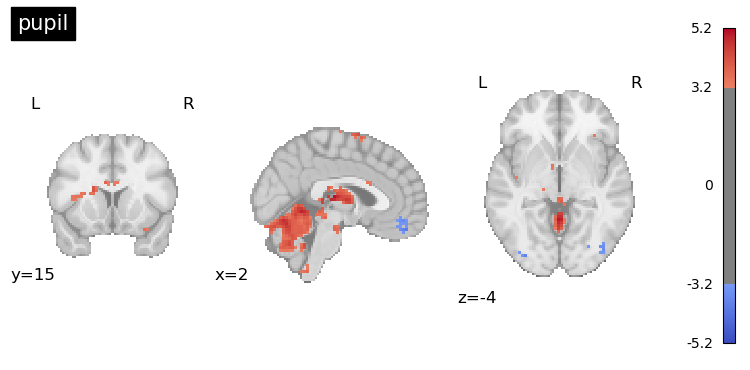

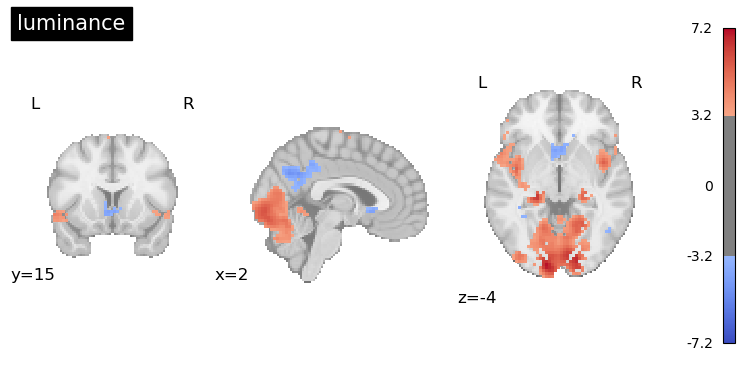

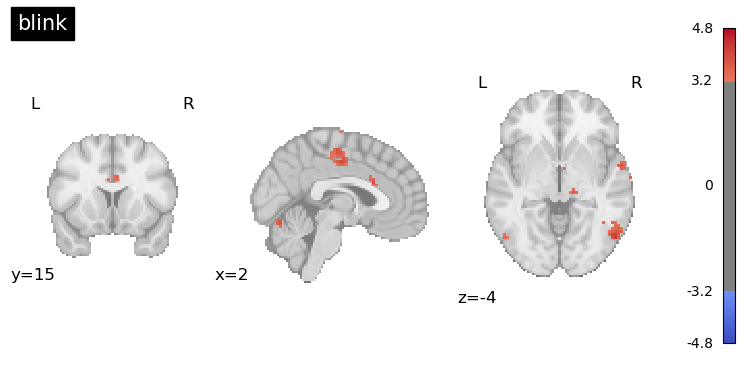

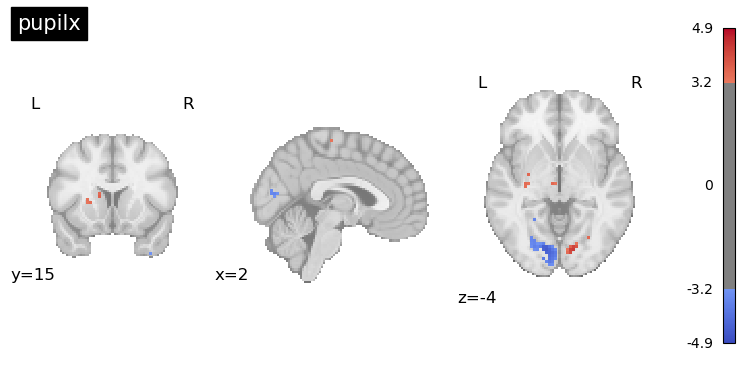

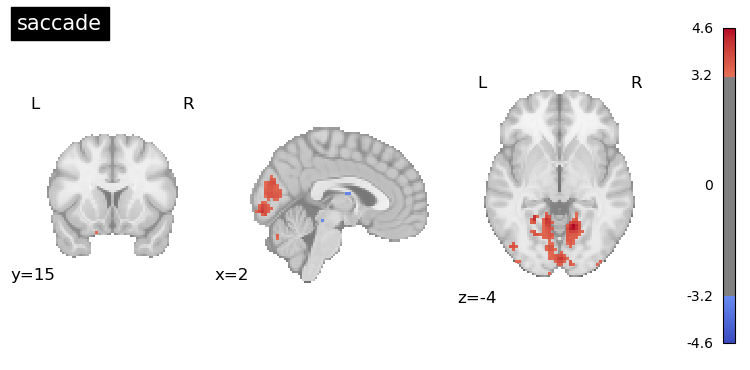

In [8]:
# luminance-controlled
file='./model33c_pupil_scaled_convolved_24z.nii.gz'
glm33c_func_nii = nib.load(file)
affine = glm33c_func_nii.affine
glm33c_func_data = glm33c_func_nii.get_fdata()
glm33c_func_data=glm33c_func_data[:,:,:,0,1]
glm33c_func_data[np.round(glm33c_func_data,17)==0]=np.nan
glm33c_func_nii = nib.Nifti1Image(glm33c_func_data,affine)  # Create the volume image.

file='./model33c_luminance_24z.nii.gz'
luminance_func_nii = nib.load(file)
luminance_func_data = luminance_func_nii.get_fdata()
luminance_func_data=luminance_func_data[:,:,:,0,1]
luminance_func_data[np.round(luminance_func_data,17)==0]=np.nan
luminance_func_nii = nib.Nifti1Image(luminance_func_data,affine)  # Create the volume image.

file='./model33c_blink_24z.nii.gz'
blink_func_nii = nib.load(file)
blink_func_data = blink_func_nii.get_fdata()
blink_func_data=blink_func_data[:,:,:,0,1]
blink_func_data[np.round(blink_func_data,17)==0]=np.nan
blink_func_nii = nib.Nifti1Image(blink_func_data,affine)  # Create the volume image.

file='./model33c_pupilx_24z.nii.gz'
pupilx_func_nii = nib.load(file)
pupilx_func_data = pupilx_func_nii.get_fdata()
pupilx_func_data=pupilx_func_data[:,:,:,0,1]
pupilx_func_data[np.round(pupilx_func_data,17)==0]=np.nan
pupilx_func_nii = nib.Nifti1Image(pupilx_func_data,affine)  # Create the volume image.


file='./model33c_saccade_24z.nii.gz'
sacc_func_nii = nib.load(file)
sacc_func_data = sacc_func_nii.get_fdata()
sacc_func_data=sacc_func_data[:,:,:,0,1]
sacc_func_data[np.round(sacc_func_data,17)==0]=np.nan
sacc_func_nii = nib.Nifti1Image(sacc_func_data,affine)  # Create the volume image.

plotting.plot_stat_map(glm33c_func_nii,
                                 display_mode="ortho", title = "pupil",
                       cmap="coolwarm",threshold = clustsim_z_thresh,
                       cut_coords = (2,15,-4), draw_cross = False)

plotting.plot_stat_map(luminance_func_nii,
                                 display_mode="ortho", title = "luminance",
                       cmap="coolwarm",threshold = clustsim_z_thresh,
                       cut_coords = (2,15,-4), draw_cross = False)

plotting.plot_stat_map(blink_func_nii,
                                 display_mode="ortho", title = "blink",
                       cmap="coolwarm",threshold = clustsim_z_thresh,
                       cut_coords = (2,15,-4), draw_cross = False)

plotting.plot_stat_map(pupilx_func_nii,
                                 display_mode="ortho", title = "pupilx",
                       cmap="coolwarm",threshold = clustsim_z_thresh,
                       cut_coords = (2,15,-4), draw_cross = False)

plotting.plot_stat_map(sacc_func_nii,
                                 display_mode="ortho", title = "saccade",
                       cmap="coolwarm",threshold = clustsim_z_thresh,
                       cut_coords = (2,15,-4), draw_cross = False)

/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_stat_map.py:208: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



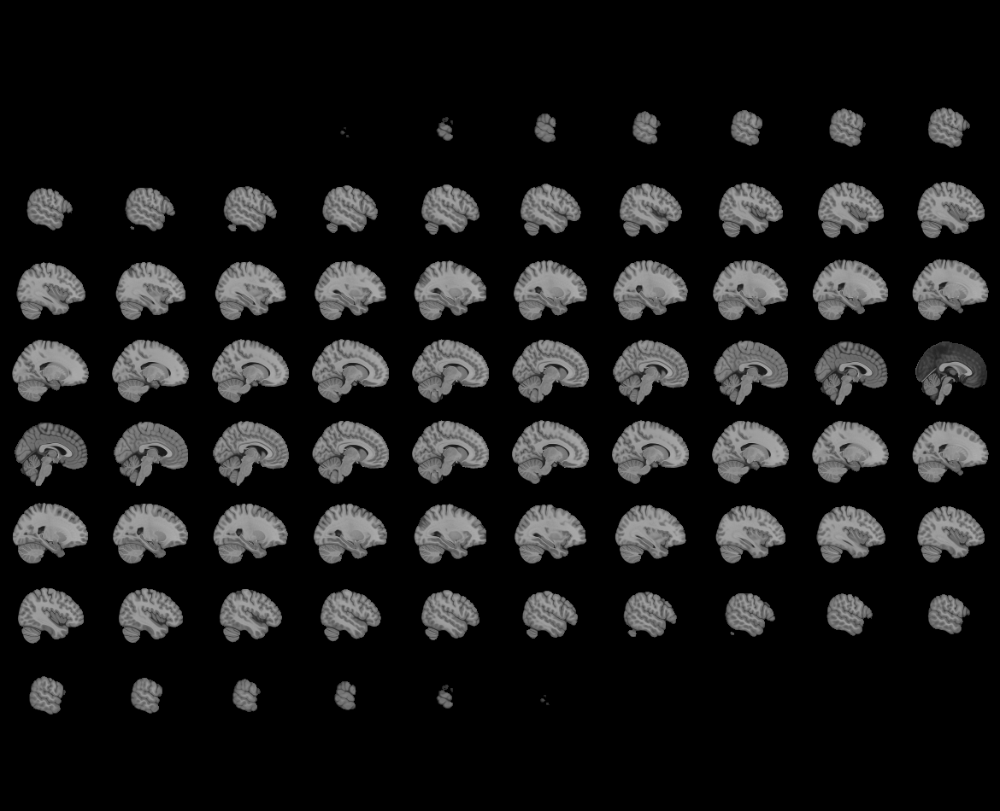
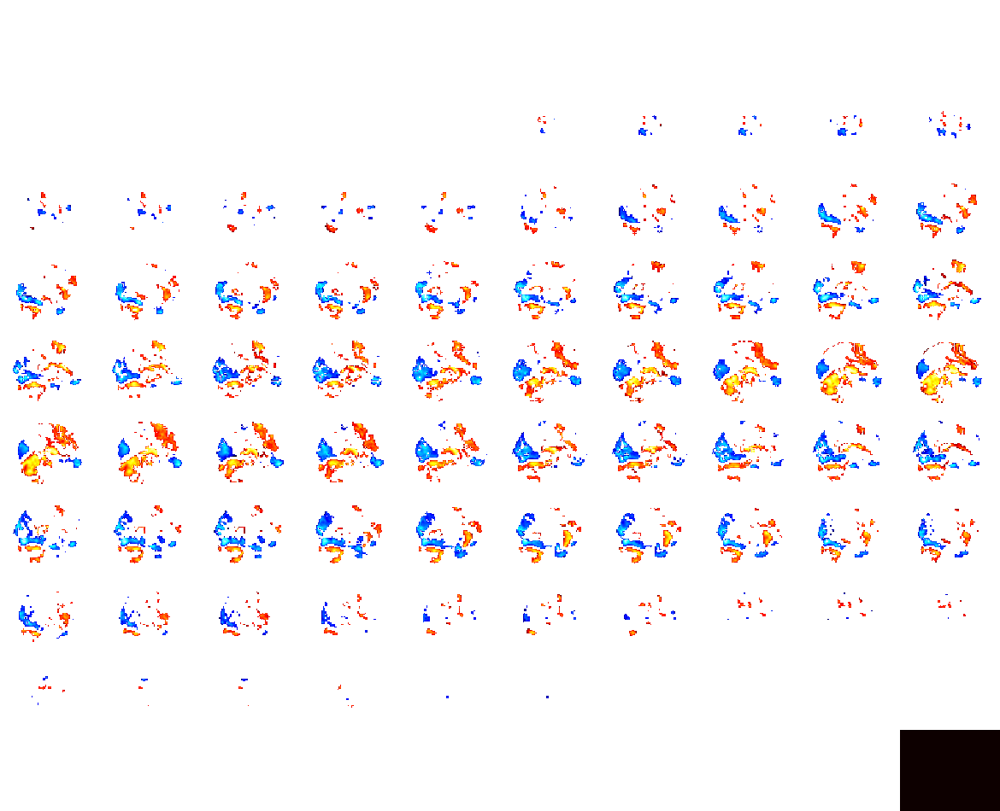

In [9]:
plotting.view_img(glm33b_func_nii,threshold=visualize_z_thresh)

/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/img_plotting.py:1416: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  safe_get_data(stat_map_img, ensure_finite=True),
/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/image/image.py:998: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  img_data = safe_get_data(img, ensure_finite=True, copy_data=copy)


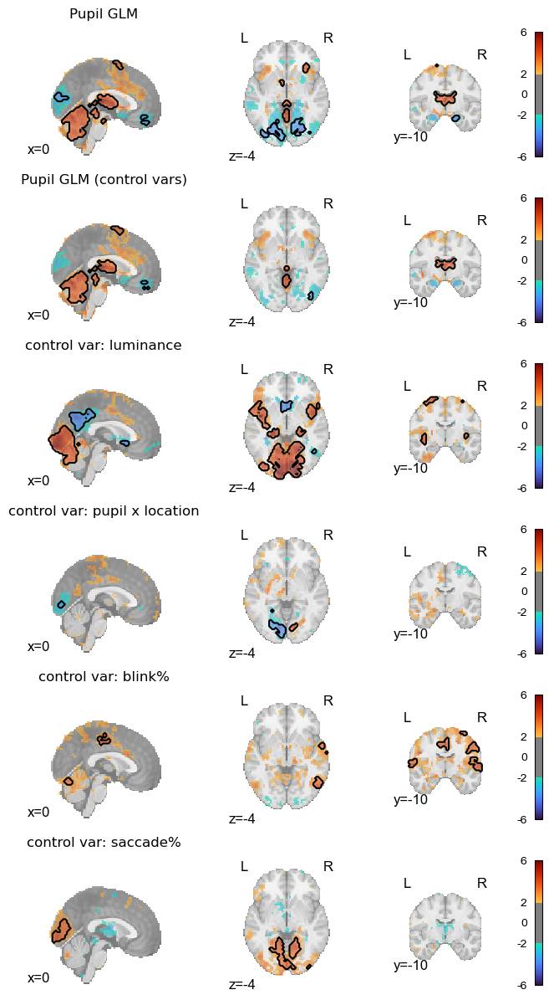

In [10]:
# List of inputs: each row is a condition
images = [glm33b_func_nii, glm33c_func_nii, luminance_func_nii, 
          pupilx_func_nii, blink_func_nii, sacc_func_nii]
titles = ["Pupil GLM", "Pupil GLM (control vars)", "control var: luminance",
          "control var: pupil x location","control var: blink%","control var: saccade%"]
display_modes = ["x", "z", "y"]
cut_coords = [[0], [-4], [-10]]

# Create 6x3 subplots
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(8, 15))
plt.rcParams['font.family'] = 'Arial'

for row_idx, (img, title) in enumerate(zip(images, titles)):
    for col_idx, (mode, coord) in enumerate(zip(display_modes, cut_coords)):
        
        # 1. Plot Main Map (Lower Threshold: visualize_z_thresh, alpha=0.6)
        display = plotting.plot_stat_map(
            img,
            display_mode=mode,
            threshold=visualize_z_thresh, 
            alpha=0.6, 
            cut_coords=coord,
            cmap="turbo",
            colorbar=(col_idx == 2),
            axes=axes[row_idx, col_idx],
            vmax=6
        )

        # 2. Prepare and Plot Contours (Higher Threshold: clustsim_z_thresh + cluster extent)
        
        # USE threshold_stats_img for efficient cluster-extent filtering
        filtered_img, _ = threshold_stats_img(
            img,
            threshold=clustsim_z_thresh,
            height_control=None, 
            cluster_threshold=clustsim_clust_thresh, 
            two_sided=True, 
        )

        # Add the resulting filtered clusters as black contours
        display.add_contours(
            filtered_img, 
            levels=[0.5], 
            colors='black', 
            linewidths=1.5
        )

        display.add_contours(
            filtered_img, 
            levels=[-0.5], 
            colors='black', 
            linewidths=1.5,
            linestyles='solid'
        )
        # Add title only to first column
        if col_idx == 0:
            axes[row_idx, col_idx].set_title(title, fontsize=12, color="black", backgroundcolor="white")
# Save and show figure
plt.savefig('glm_luminance_SI.tiff', dpi=600, bbox_inches='tight')
plt.show()


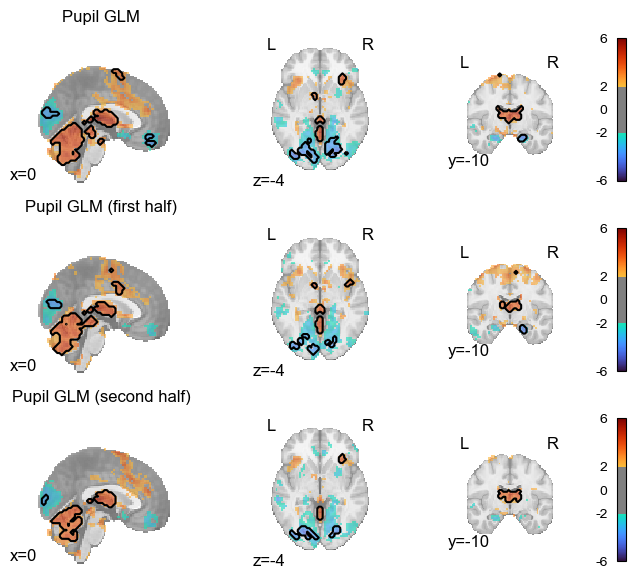

In [11]:
# List of inputs: each row is a condition
images = [glm33b_func_nii, glm33b_h1_func_nii,glm33b_h2_func_nii]
titles = ["Pupil GLM", "Pupil GLM (first half)", "Pupil GLM (second half)"]
display_modes = ["x", "z", "y"]
cut_coords = [[0], [-4], [-10]]

# Create 6x3 subplots
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(8, 7))
plt.rcParams['font.family'] = 'Arial'

for row_idx, (img, title) in enumerate(zip(images, titles)):
    for col_idx, (mode, coord) in enumerate(zip(display_modes, cut_coords)):
        
        # 1. Plot Main Map (Lower Threshold: visualize_z_thresh, alpha=0.6)
        display = plotting.plot_stat_map(
            img,
            display_mode=mode,
            threshold=visualize_z_thresh, 
            alpha=0.6, 
            cut_coords=coord,
            cmap="turbo",
            colorbar=(col_idx == 2),
            axes=axes[row_idx, col_idx],
            vmax=6
        )

        # 2. Prepare and Plot Contours (Higher Threshold: clustsim_z_thresh + cluster extent)
        
        # USE threshold_stats_img for efficient cluster-extent filtering
        filtered_img, _ = threshold_stats_img(
            img,
            threshold=clustsim_z_thresh,
            height_control=None, 
            cluster_threshold=clustsim_clust_thresh, 
            two_sided=True, 
        )

        # Add the resulting filtered clusters as black contours
        display.add_contours(
            filtered_img, 
            levels=[0.5], 
            colors='black', 
            linewidths=1.5
        )

        display.add_contours(
            filtered_img, 
            levels=[-0.5], 
            colors='black', 
            linewidths=1.5,
            linestyles='solid'
        )
        # Add title only to first column
        if col_idx == 0:
            axes[row_idx, col_idx].set_title(title, fontsize=12, color="black", backgroundcolor="white")
# Save and show figure
plt.savefig('glm_luminance_SI2.tiff', dpi=600, bbox_inches='tight')
plt.show()


/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/displays/_slicers.py:366: UserWarning: empty mask
  self._map_show(img, type="contour", threshold=threshold, **kwargs)


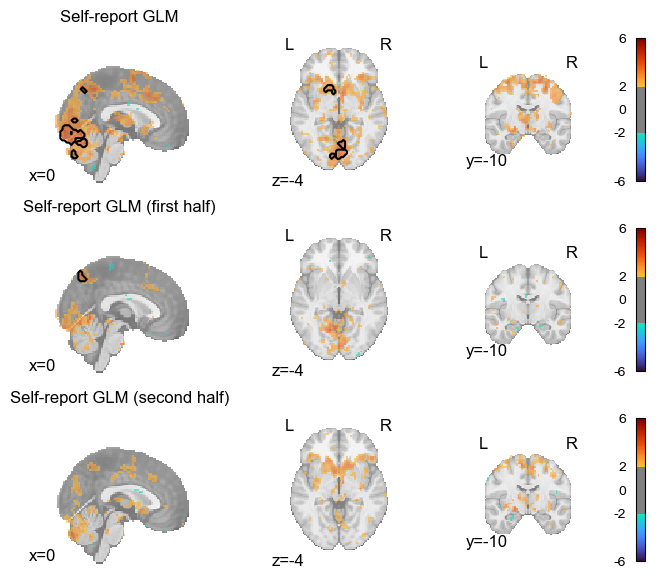

In [13]:
# List of inputs: each row is a condition
images = [glm27_func_nii,glm27c_h1_func_nii,glm27c_h2_func_nii]
titles = ["Self-report GLM","Self-report GLM (first half)", "Self-report GLM (second half)"]
display_modes = ["x", "z", "y"]
cut_coords = [[0], [-4], [-10]]

# Create 6x3 subplots
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(8, 7))
plt.rcParams['font.family'] = 'Arial'

for row_idx, (img, title) in enumerate(zip(images, titles)):
    for col_idx, (mode, coord) in enumerate(zip(display_modes, cut_coords)):
        
        # 1. Plot Main Map (Lower Threshold: visualize_z_thresh, alpha=0.6)
        display = plotting.plot_stat_map(
            img,
            display_mode=mode,
            threshold=visualize_z_thresh, 
            alpha=0.6, 
            cut_coords=coord,
            cmap="turbo",
            colorbar=(col_idx == 2),
            axes=axes[row_idx, col_idx],
            vmax=6
        )

        # 2. Prepare and Plot Contours (Higher Threshold: clustsim_z_thresh + cluster extent)
        
        # USE threshold_stats_img for efficient cluster-extent filtering
        filtered_img, _ = threshold_stats_img(
            img,
            threshold=clustsim_z_thresh,
            height_control=None, 
            cluster_threshold=clustsim_clust_thresh, 
            two_sided=True, 
        )

        # Add the resulting filtered clusters as black contours
        display.add_contours(
            filtered_img, 
            levels=[0.5], 
            colors='black', 
            linewidths=1.5
        )

        display.add_contours(
            filtered_img, 
            levels=[-0.5], 
            colors='black', 
            linewidths=1.5,
            linestyles='solid'
        )
        # Add title only to first column
        if col_idx == 0:
            axes[row_idx, col_idx].set_title(title, fontsize=12, color="black", backgroundcolor="white")
# Save and show figure
plt.savefig('glm_arousal_SI2.tiff', dpi=600, bbox_inches='tight')
plt.show()


--- Diagnosing Negative Clusters in pupilx_func_nii ---
Z-score Height Threshold: Z <= -3.227
Minimum Cluster Size (Voxels): 30

Found 14 components (blobs) that meet the height threshold.

Report of Negative Cluster Sizes (Sorted by Largest):
Cluster #4: 391 voxels (SIGNIFICANT - PLOTTED)
Cluster #8: 110 voxels (SIGNIFICANT - PLOTTED)
Cluster #3: 28 voxels (TOO SMALL)
Cluster #6: 21 voxels (TOO SMALL)
Cluster #1: 7 voxels (TOO SMALL)
Cluster #5: 4 voxels (TOO SMALL)
Cluster #7: 2 voxels (TOO SMALL)
Cluster #9: 2 voxels (TOO SMALL)
Cluster #2: 1 voxels (TOO SMALL)
Cluster #10: 1 voxels (TOO SMALL)
Cluster #11: 1 voxels (TOO SMALL)
Cluster #12: 1 voxels (TOO SMALL)
Cluster #13: 1 voxels (TOO SMALL)
Cluster #14: 1 voxels (TOO SMALL)

--- Plotting Significant Clusters: Z-score > 3.227, Extent > 30 Voxels ---


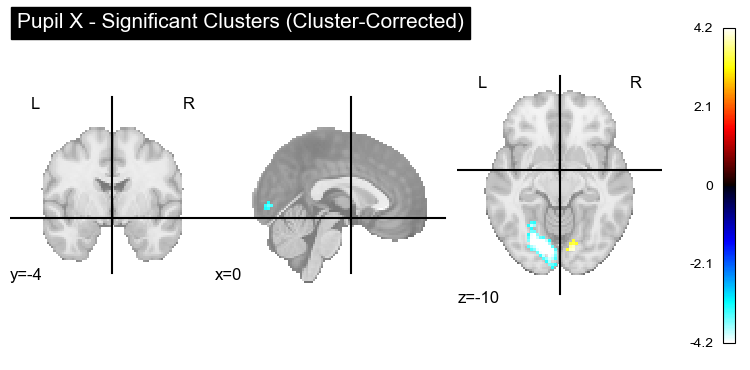

In [52]:

# def diagnose_negative_clusters(nii_img, z_thresh, cluster_thresh):
#     """
#     Performs cluster-extent filtering on negative values and reports the size 
#     of all detected negative clusters (as provided in your request).
#     """
#     try:
#         # Load data
#         img_data = nii_img.get_fdata()
#     except AttributeError:
#         print("Error: The input 'nii_img' does not appear to be a valid NIfTI object.")
#         print("Please ensure 'pupilx_func_nii' is loaded correctly before calling this function.")
#         return

#     print(f"--- Diagnosing Negative Clusters in {nii_img.get_filename() or 'pupilx_func_nii'} ---")
#     print(f"Z-score Height Threshold: Z <= {-z_thresh}")
#     print(f"Minimum Cluster Size (Voxels): {cluster_thresh}")
    
#     # 1. Apply Height Threshold for Negative Values
#     neg_mask = img_data <= -z_thresh

#     # 2. Label connected components (clusters)
#     labeled_neg, num_neg = label(neg_mask)
    
#     if num_neg == 0:
#         print("\nNo voxels met the height threshold.")
#         return

#     print(f"\nFound {num_neg} components (blobs) that meet the height threshold.")
    
#     # 3. Calculate and report size for all components
#     cluster_sizes = {}
    
#     for cluster_idx in range(1, num_neg + 1):
#         size = np.sum(labeled_neg == cluster_idx)
#         cluster_sizes[cluster_idx] = size
        
#     # Sort and print results
#     sorted_sizes = sorted(cluster_sizes.items(), key=lambda item: item[1], reverse=True)

#     print("\nReport of Negative Cluster Sizes (Sorted by Largest):")
#     for idx, size in sorted_sizes:
#         status = " (TOO SMALL)"
#         if size >= cluster_thresh:
#             status = " (SIGNIFICANT - PLOTTED)"
        
#         print(f"Cluster #{idx}: {size} voxels{status}")


# def plot_significant_clusters(nii_img, z_thresh, cluster_thresh, coords, mode):
#     """
#     Filters the NIfTI image for significant clusters and plots the result.
#     """
#     # Perform cluster-extent thresholding
#     print(f"\n--- Plotting Significant Clusters: Z-score > {z_thresh}, Extent > {cluster_thresh} Voxels ---")
    
#     # Use nilearn's robust function to handle bilateral (positive/negative) cluster filtering
#     filtered_img, _ = threshold_stats_img(
#         nii_img,
#         threshold=z_thresh,
#         height_control=None, 
#         cluster_threshold=cluster_thresh, 
#         two_sided=True, # Essential to include both positive and negative results
#     )

#     # Plot the filtered image. Only the significant clusters will be visible.
#     plotting.plot_stat_map(
#         filtered_img,
#         title=f"Pupil X - Significant Clusters (Cluster-Corrected)",
#         cut_coords=coords, 
#         display_mode=mode,
#         cmap='cold_hot', # Good two-sided colormap
#         vmax=z_thresh + 1, # Set dynamic range to be slightly above threshold for effect
#         vmin=-(z_thresh + 1),
#         colorbar=True,
#     )
#     plotting.show()

# # 2. Run the diagnostic to confirm cluster sizes
# diagnose_negative_clusters(pupilx_func_nii, clustsim_z_thresh, clustsim_clust_thresh)

# # 3. Plot the significant clusters
# plot_significant_clusters(
#     pupilx_func_nii, 
#     clustsim_z_thresh, 
#     clustsim_clust_thresh,
#     [0, -4, -10],
#     # The display mode to visualize
#     'ortho' # Use 'ortho' or 'z' depending on preference
# )

## read in the GLM with both regressors

/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_stat_map.py:208: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



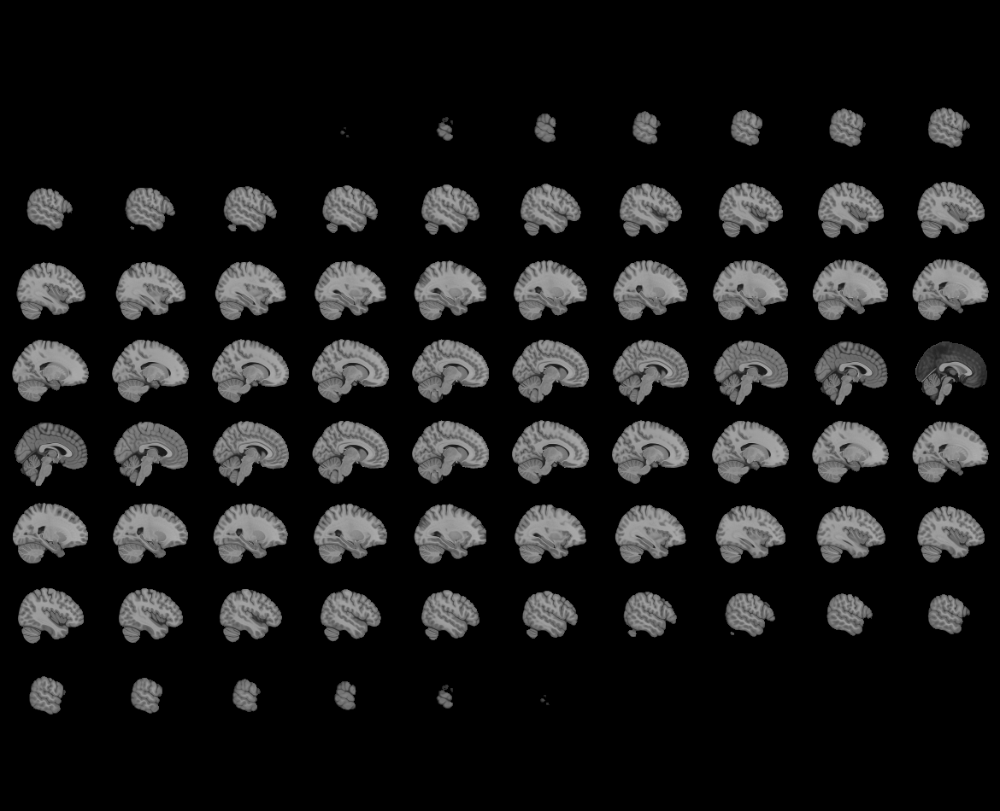
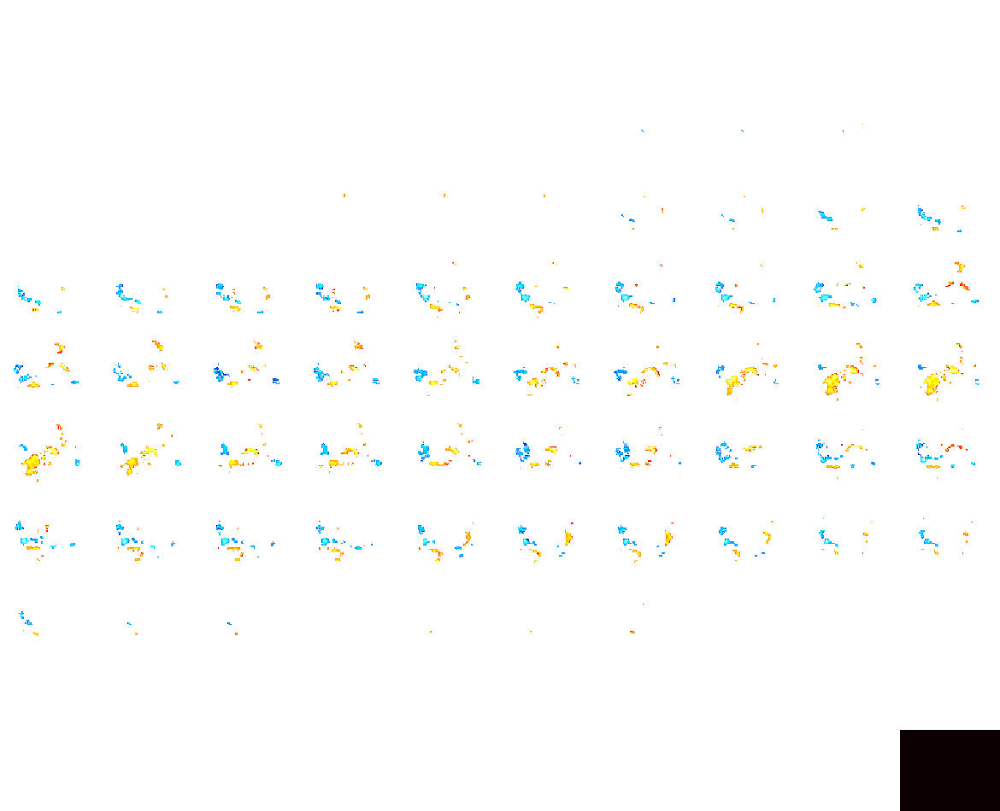

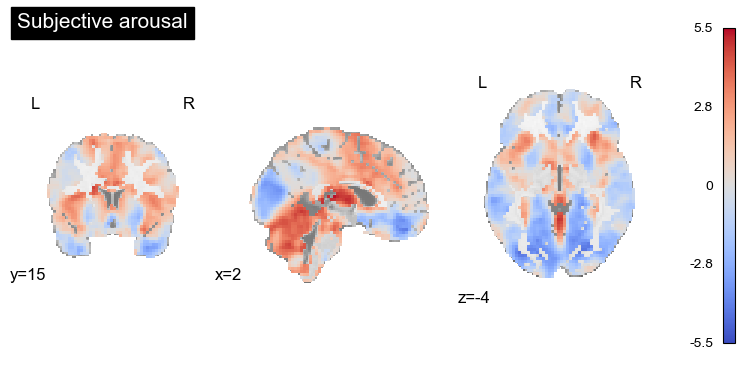

In [13]:
file='./model55_pupil_scaled_convolved_24z.nii.gz'
glm55_pupil_func_nii = nib.load(file)
glm55_pupil_func_data = glm55_pupil_func_nii.get_fdata()
glm55_pupil_func_data=glm55_pupil_func_data[:,:,:,0,1]
glm55_pupil_func_data[np.round(glm55_pupil_func_data,17)==0]=np.nan #deal with 0s
glm55_pupil_func_nii = nib.Nifti1Image(glm55_pupil_func_data,affine)  # Create the volume image.

plotting.plot_stat_map(glm55_pupil_func_nii, title="Subjective arousal", 
                                 display_mode="ortho", 
                       cmap="coolwarm",
                       cut_coords = (2,15,-4), draw_cross = False)

plotting.view_img(glm55_pupil_func_nii,threshold = clustsim_z_thresh)

/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/img_plotting.py:1416: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  safe_get_data(stat_map_img, ensure_finite=True),
/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_stat_map.py:208: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_document.py:103: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



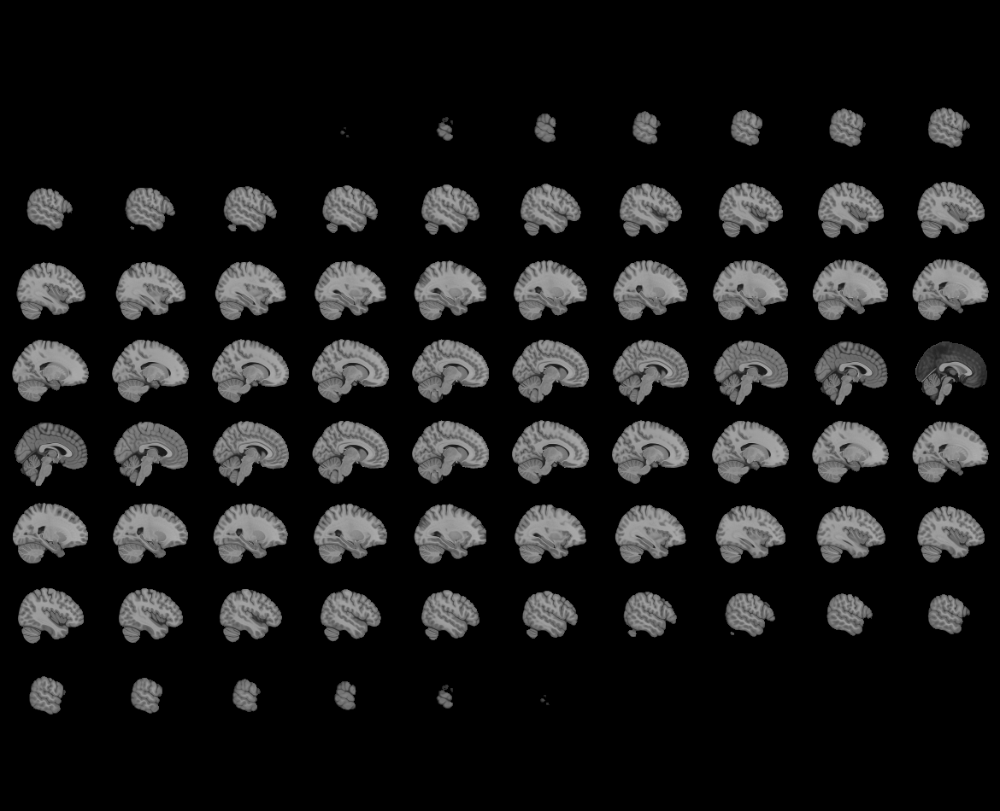
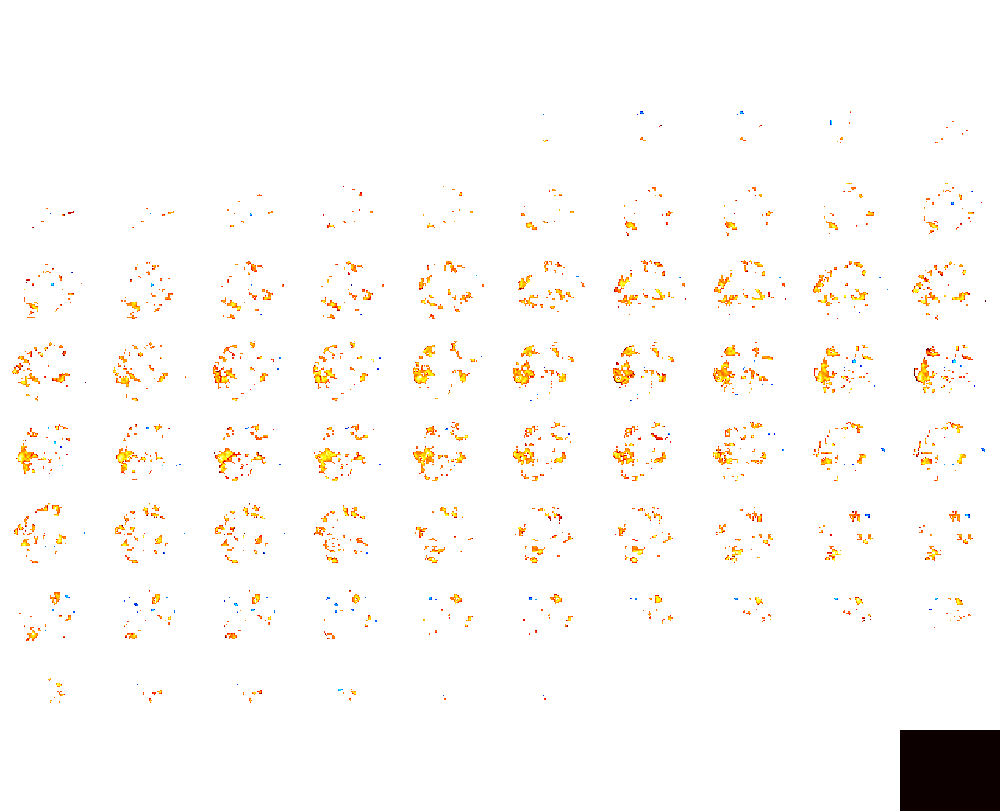

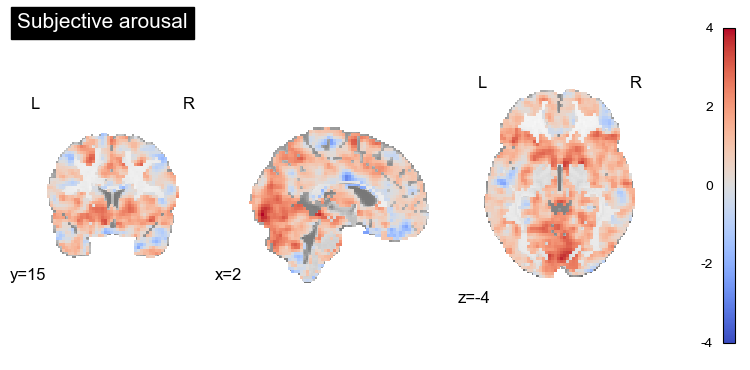

In [15]:
file='./model55_param_arous_early_24z.nii.gz'
glm55_arous_func_nii = nib.load(file)
glm55_arous_func_data = glm55_arous_func_nii.get_fdata()
glm55_arous_func_data=glm55_arous_func_data[:,:,:,0,1]
glm55_arous_func_data[np.round(glm55_arous_func_data,17)==0]=np.nan #deal with 0s
glm55_arous_func_nii = nib.Nifti1Image(glm55_arous_func_data,affine)  # Create the volume image.

plotting.plot_stat_map(glm55_arous_func_nii, title="Subjective arousal", 
                                 display_mode="ortho", 
                       cmap="coolwarm",
                       cut_coords = (2,15,-4), draw_cross = False)

plotting.view_img(glm55_arous_func_nii,threshold = 2)

/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/img_plotting.py:1416: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  safe_get_data(stat_map_img, ensure_finite=True),
/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/image/image.py:998: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  img_data = safe_get_data(img, ensure_finite=True, copy_data=copy)


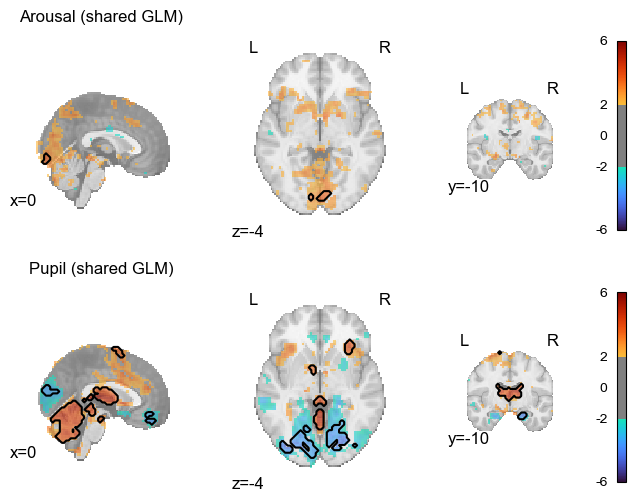

In [73]:
# List of inputs: each row is a condition (arousal, pupil)
images = [glm55_arous_func_nii, glm55_pupil_func_nii]
titles = ["Arousal (shared GLM)", "Pupil (shared GLM)"]
display_modes = ["x", "z", "y"]
cut_coords = [[0], [-4], [-10]]

# Create 2x3 subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(8, 6))
plt.rcParams['font.family'] = 'Arial'

for row_idx, (img, title) in enumerate(zip(images, titles)):
    for col_idx, (mode, coord) in enumerate(zip(display_modes, cut_coords)):
        
        # 1. Plot Main Map (Lower Threshold: visualize_z_thresh, alpha=0.6)
        display = plotting.plot_stat_map(
            img,
            display_mode=mode,
            threshold=visualize_z_thresh, 
            alpha=0.6, 
            cut_coords=coord,
            cmap="turbo",
            colorbar=(col_idx == 2),
            axes=axes[row_idx, col_idx],
            vmax=6
        )

        # 2. Prepare and Plot Contours (Higher Threshold: clustsim_z_thresh + cluster extent)
        filtered_img, _ = threshold_stats_img(
            img,
            threshold=clustsim_z_thresh,
            height_control=None, 
            cluster_threshold=clustsim_clust_thresh, 
            two_sided=True
        )

        display.add_contours(
            filtered_img, 
            levels=[0.5], 
            colors='black', 
            linewidths=1.5
        )
        display.add_contours(
            filtered_img, 
            levels=[-0.5], 
            colors='black', 
            linewidths=1.5,
            linestyles='solid'
        )

        # Add title only to first column
        if col_idx == 0:
            axes[row_idx, col_idx].set_title(title, fontsize=12, color="black", backgroundcolor="white")

# Save and show figure
plt.savefig('glm_sharedGLM_SI.tiff', dpi=600, bbox_inches='tight')
plt.show()


## read in neurotransmitter map

/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_stat_map.py:208: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



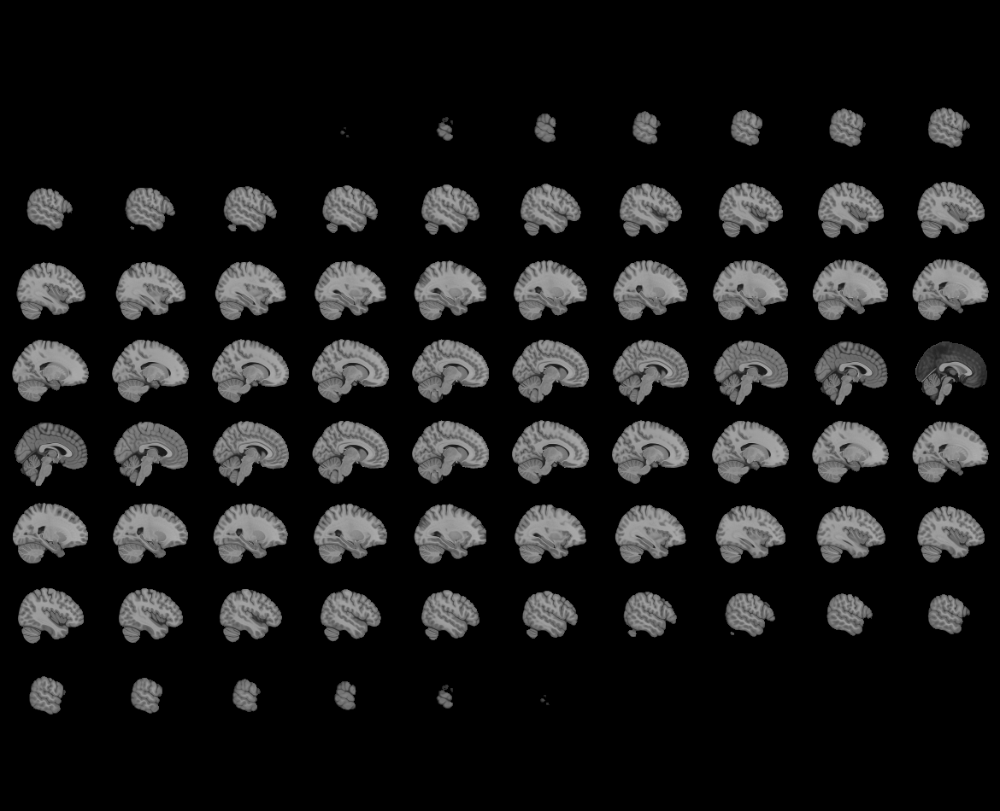
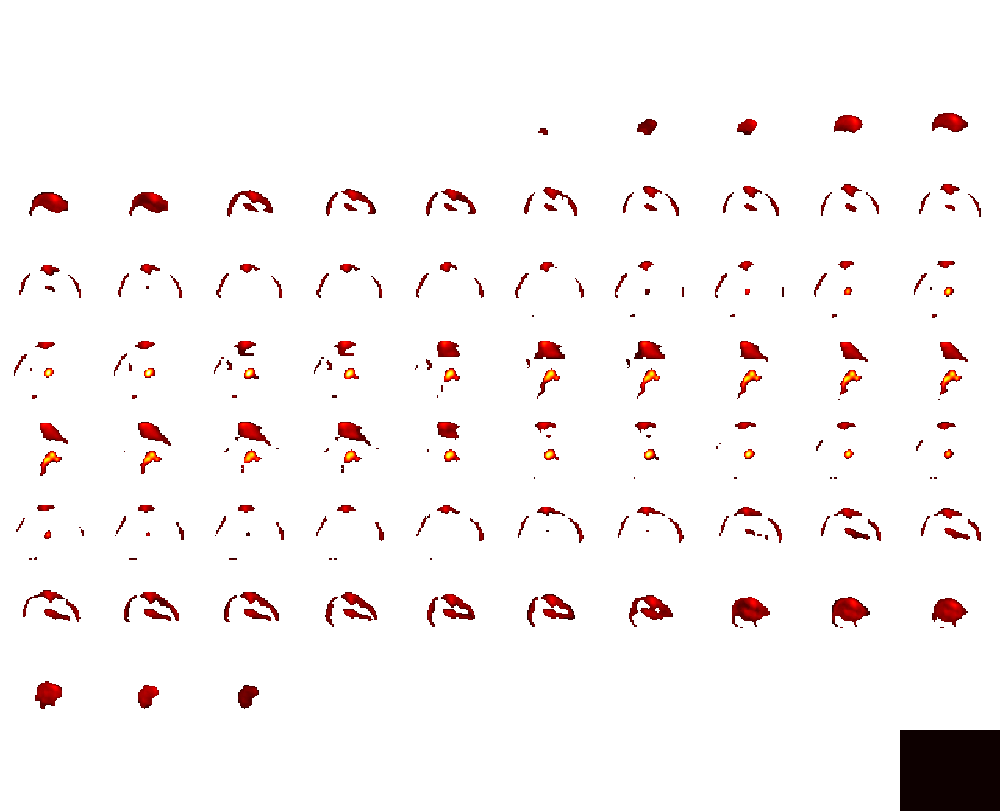

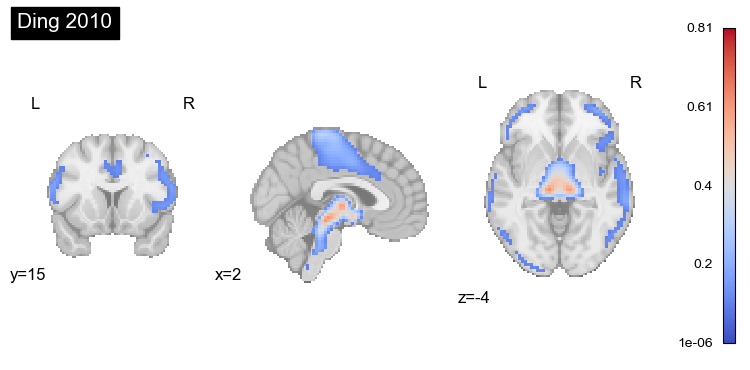

In [9]:
!3dresample -overwrite -input ./Markello_neuromaps/source-ding2010_desc-mrb_space-MNI152_res-1mm_feature.nii.gz -master model33b_pupil_scaled_convolved_24z.nii.gz -prefix ./Markello_neuromaps/source-ding2010_desc-mrb_space-MNI152_res-2.9mm_feature.nii.gz
file='./Markello_neuromaps/source-ding2010_desc-mrb_space-MNI152_res-2.9mm_feature.nii.gz'
ding2010_func_nii = nib.load(file)
affine = ding2010_func_nii.affine
ding2010_func_data = ding2010_func_nii.get_fdata()
ding2010_func_data[ding2010_func_data <= 0.1] = np.nan
ding2010_func_nii = nib.Nifti1Image(ding2010_func_data,affine)  # Create the volume image.

plotting.plot_stat_map(ding2010_func_nii, title="Ding 2010", 
                       cmap="coolwarm",
                       cut_coords = (2,15,-4), draw_cross = False)

plotting.view_img(ding2010_func_nii, title="Ding 2010")

/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/img_plotting.py:1416: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  safe_get_data(stat_map_img, ensure_finite=True),
/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_stat_map.py:208: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



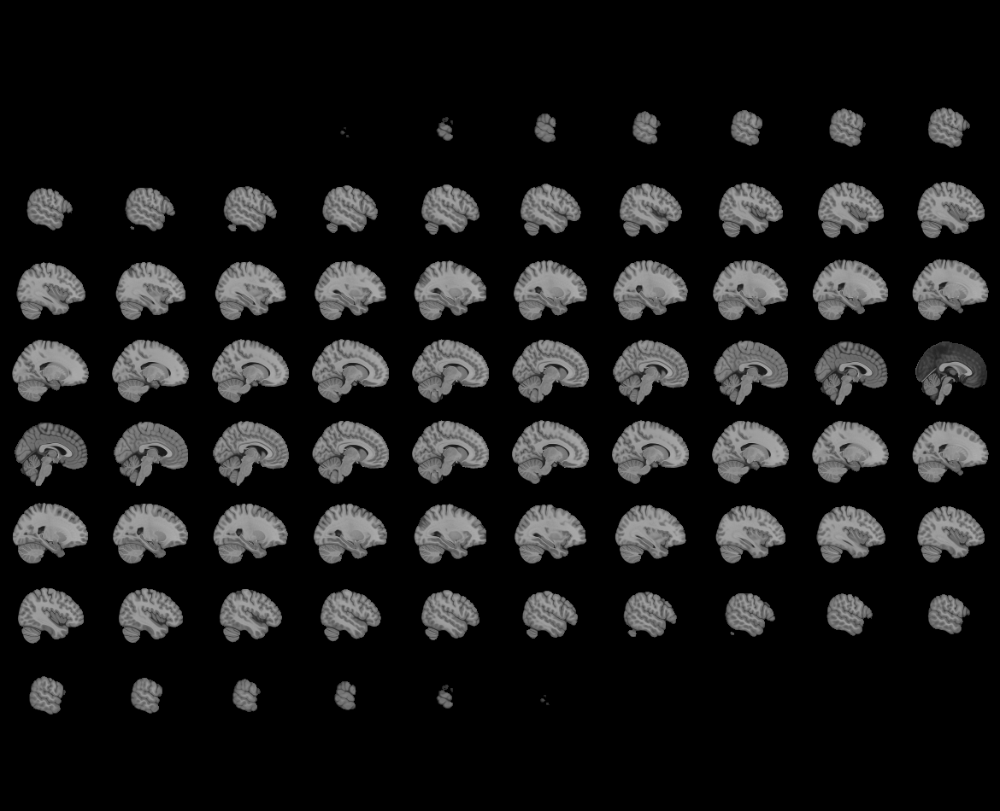
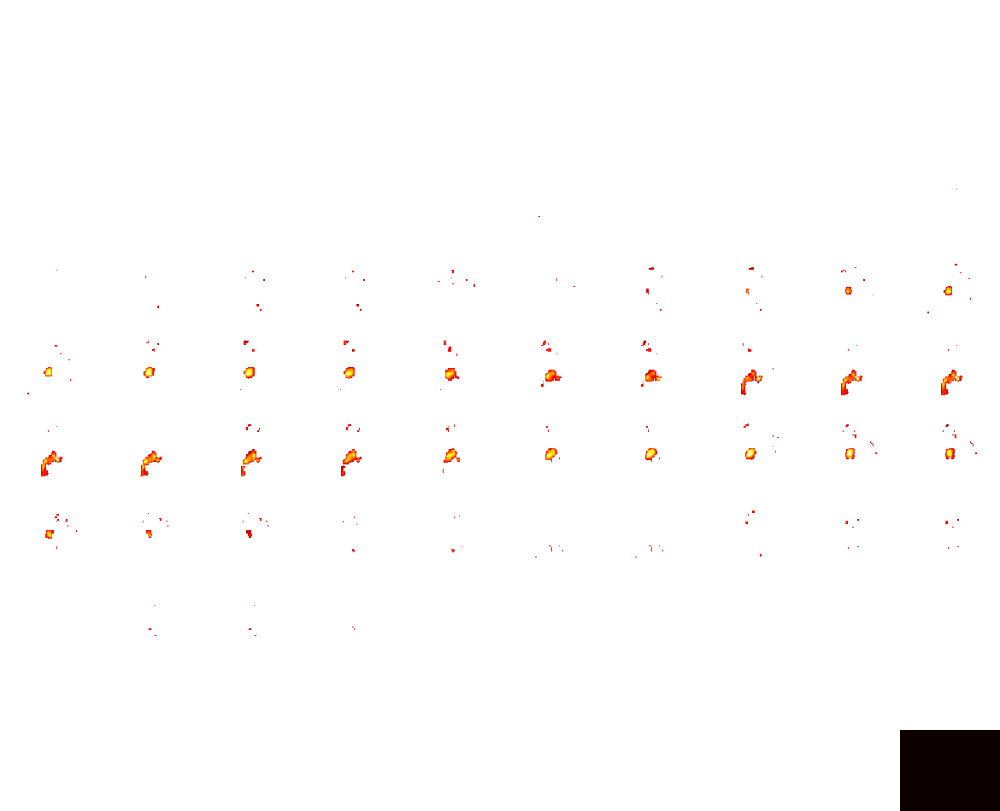

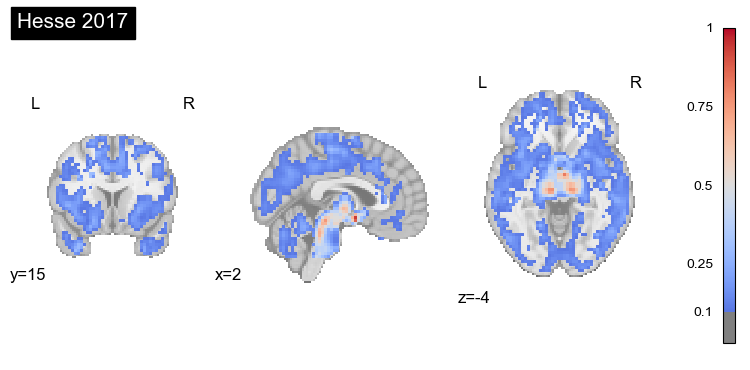

In [10]:
#should not use this -- this is on obese people
!3dresample -overwrite -input ./Markello_neuromaps/source-hesse2017_desc-methylreboxetine_space-MNI152_res-3mm_feature.nii.gz -master model33b_pupil_scaled_convolved_24z.nii.gz -prefix ./Markello_neuromaps/source-hesse2017_desc-methylreboxetine_space-MNI152_res-2.9mm_feature.nii.gz
file='./Markello_neuromaps/source-hesse2017_desc-methylreboxetine_space-MNI152_res-2.9mm_feature.nii.gz'
hesse2017_func_nii = nib.load(file)
affine = hesse2017_func_nii.affine
hesse2017_func_data = hesse2017_func_nii.get_fdata()
hesse2017_func_data[hesse2017_func_data <= 0] = np.nan
hesse2017_func_data=hesse2017_func_data/100 #I assume that these are percentage
# # ding2010_func_data=glm27_func_data[:,:,:,0,1]
hesse2017_func_nii = nib.Nifti1Image(hesse2017_func_data,affine)  # Create the volume image.

plotting.plot_stat_map(hesse2017_func_nii, title="Hesse 2017", 
                       cmap="coolwarm", threshold = 0.1,
                       cut_coords = (2,15,-4), draw_cross = False)

plotting.view_img(hesse2017_func_nii, title="Hesse 2017", threshold = 0.3)

## read in conjunction map from nilearn

/Users/yanyan/miniforge3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/image/resampling.py:297: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn(
/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_document.py:103: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



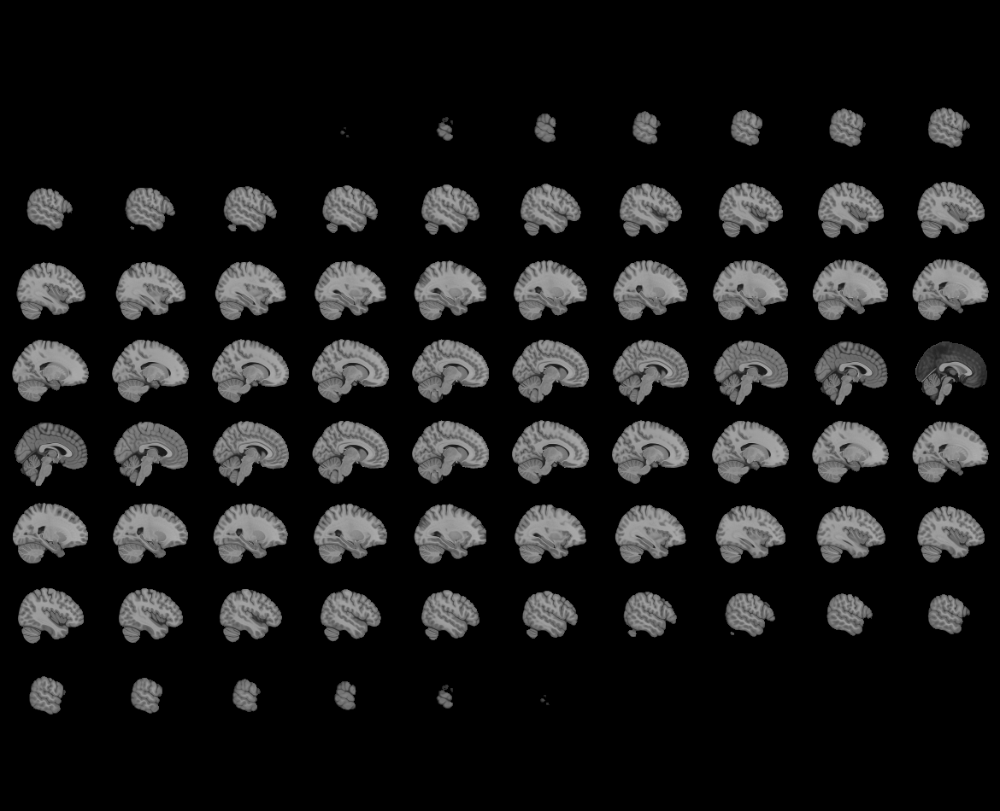
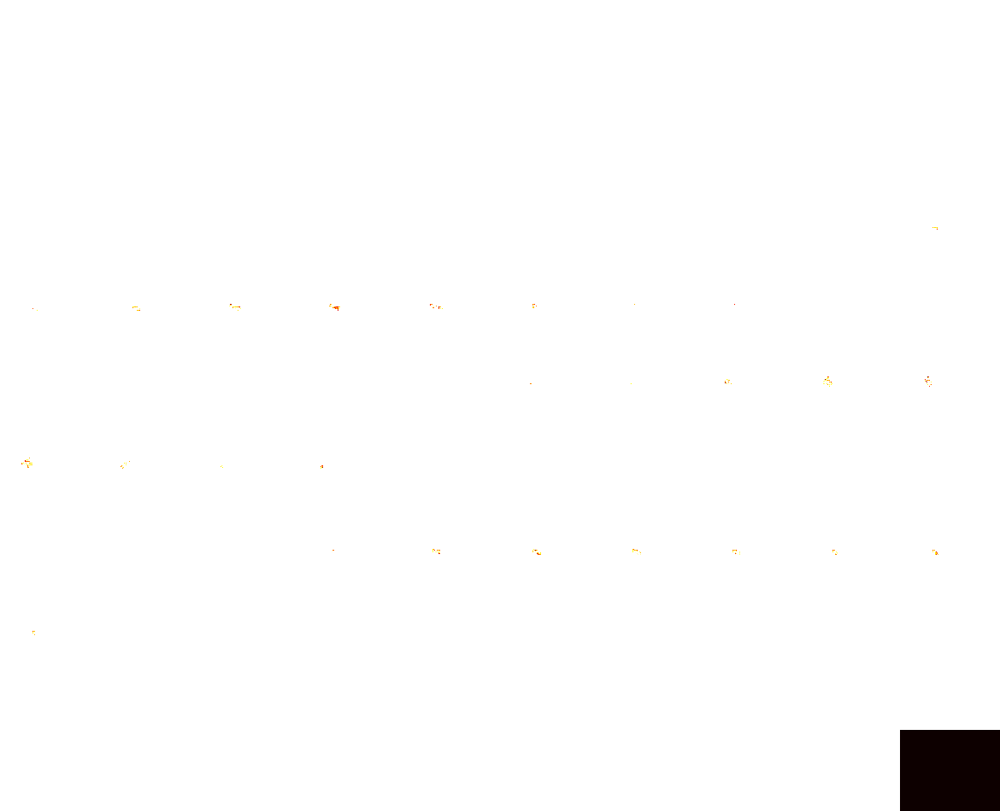

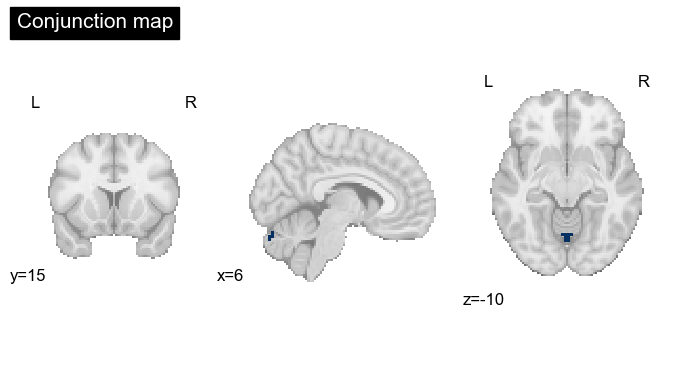

In [67]:
file='./conjunction_arousal_pupil_nilearn.nii.gz'
conj_func_nii = nib.load(file)
conj_func_data = conj_func_nii.get_fdata()
conj_func_data[conj_func_data<=0]=0
conj_func_data[conj_func_data>0]=1
conj_func_nii = nib.Nifti1Image(conj_func_data,affine)  # Create the volume image.

conj_func_nii,threshold = threshold_stats_img(
    conj_func_nii, 
    height_control = None,
    threshold = 0.1,
    cluster_threshold=10,
)

plotting.plot_stat_map(conj_func_nii, title="Conjunction map", 
                                 display_mode="ortho", 
                       cmap="RdBu",colorbar=False,
                       cut_coords = (6,15,-10), draw_cross = False)

plotting.view_img(conj_func_nii)

/Users/yanyan/miniforge3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/image/resampling.py:297: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn(
/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_document.py:103: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



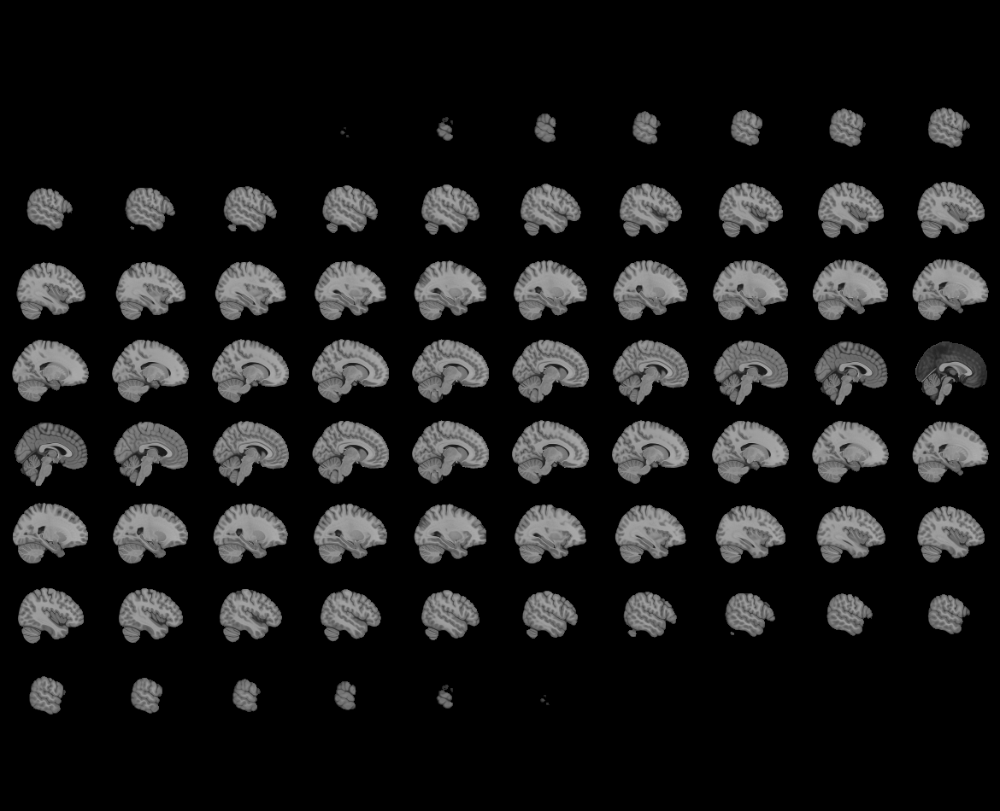
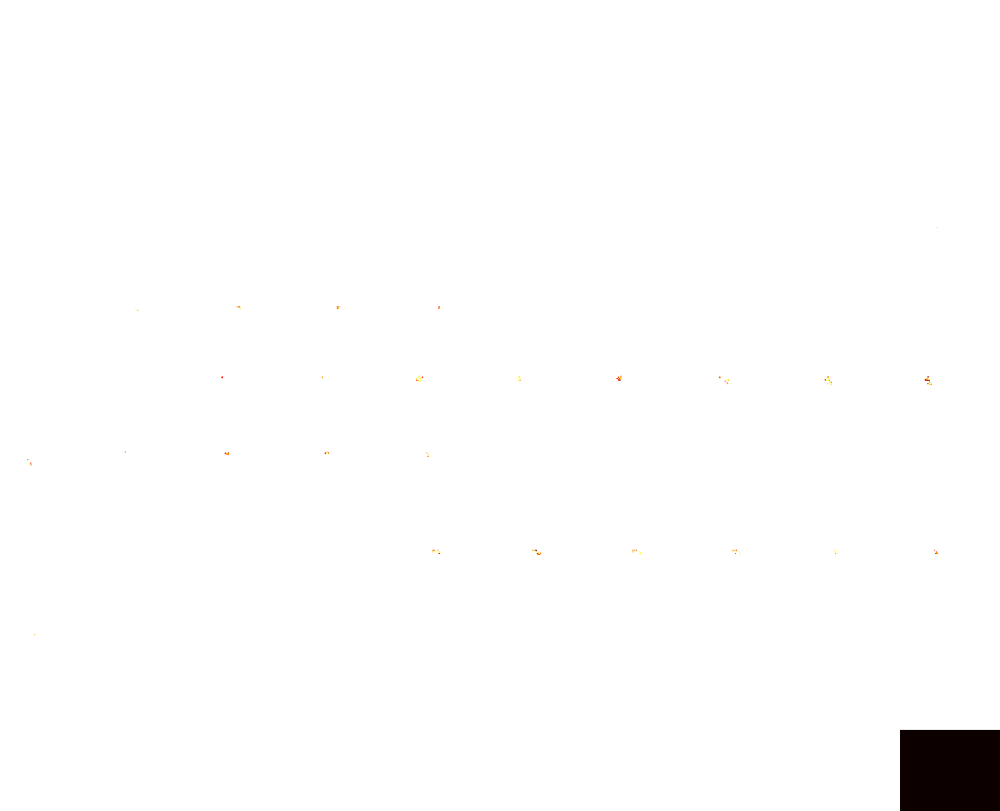

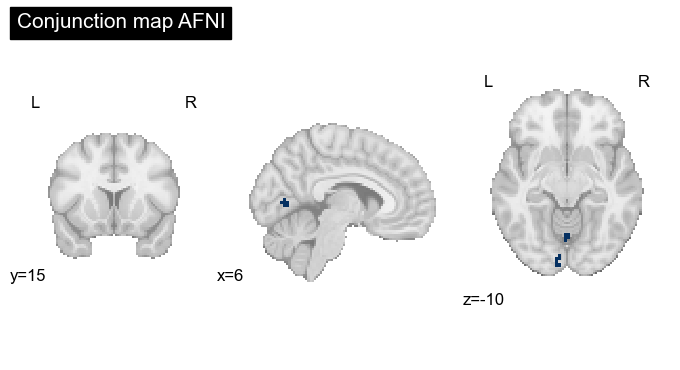

In [75]:
file='./conjunction_arousal_pupil.nii.gz'
conj_func_nii_ = nib.load(file)
conj_func_data = conj_func_nii_.get_fdata()
conj_func_data[conj_func_data<=0]=0
conj_func_data[conj_func_data>0]=1
conj_func_nii_ = nib.Nifti1Image(conj_func_data,affine)  # Create the volume image.

conj_func_nii_,threshold = threshold_stats_img(
    conj_func_nii_,
    height_control = None,
    threshold = 0.1,
    cluster_threshold=10,
)

plotting.plot_stat_map(conj_func_nii_, title="Conjunction map AFNI", 
                                 display_mode="ortho", 
                       cmap="RdBu",colorbar=False,
                       cut_coords = (6,15,-10), draw_cross = False)

plotting.view_img(conj_func_nii_)

/var/folders/q6/h8ld6fr92hj5v7s22m9q32rr0000gn/T/ipykernel_6142/2194650063.py:26: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


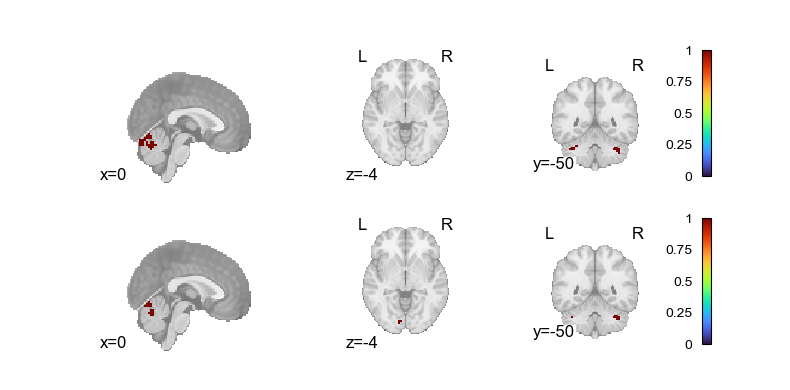

In [13]:
# Set font
plt.rcParams['font.family'] = 'Arial'

# Create figure
fig, axes = plt.subplots(2, 3, figsize=(8, 4))

# Define parameters for plotting
images = [conj_func_nii, conj_func_nii_]
modes = ["x", "z", "y"]
coords = [[0], [-4], [-50]]

# Loop over rows (images) and columns (viewing directions)
for i, img in enumerate(images):
    for j, (mode, coord) in enumerate(zip(modes, coords)):
        plotting.plot_stat_map(
            img,
            display_mode=mode,
            cut_coords=coord,
            cmap="turbo",
            threshold=0,
            colorbar=(j == 2),  # Only last column has colorbar
            axes=axes[i, j]
        )

# Adjust layout and save
plt.tight_layout()
plt.savefig('glm_fig_brief2.tiff', dpi=600, bbox_inches='tight')
plt.show()


/var/folders/q6/h8ld6fr92hj5v7s22m9q32rr0000gn/T/ipykernel_31236/2564663710.py:96: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


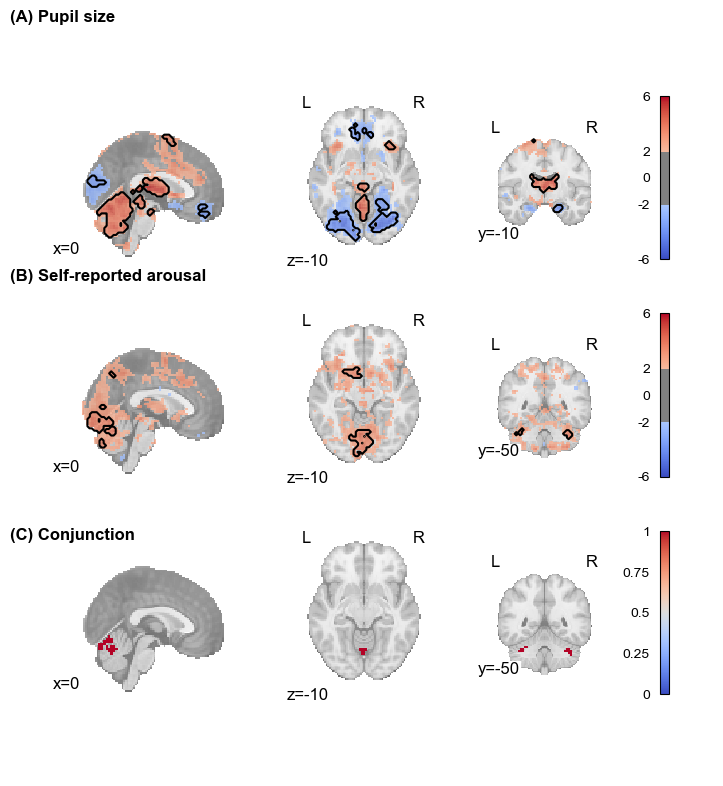

In [70]:
vmin_min_rows_0_1 = -6
vmax_min_rows_0_1 = 6

plt.rcParams['font.family'] = 'Arial'

row_labels = ["(A) Pupil size", "(B) Self-reported arousal", "(C) Conjunction"]

images = [glm33b_func_nii, glm27_func_nii, conj_func_nii]
cmaps = ["coolwarm", "coolwarm", "coolwarm"]
thresholds = [visualize_z_thresh, visualize_z_thresh, 0]  # Use lower threshold for A/B

display_modes = ["x", "z", "y"]
cut_coords = [[0], [-10], [-10]]
column_widths = [1, 0.8, 1]

fig = plt.figure(figsize=(8, 8))
gs = fig.add_gridspec(3, 3, width_ratios=column_widths)

for row_idx, (img, cmap, thresh) in enumerate(zip(images, cmaps, thresholds)):
    for col_idx, mode in enumerate(display_modes):
        
        if mode == "y" and row_idx in [1, 2]:
            coord = [-50]
        else:
            coord = cut_coords[col_idx]

        ax = fig.add_subplot(gs[row_idx, col_idx])

        vmin_val = None
        vmax_val = None
        show_colorbar = (col_idx == 2)

        if row_idx < 2:  # Apply for figures A and B
            vmin_val = vmin_min_rows_0_1
            vmax_val = vmax_min_rows_0_1

            # 1. Plot main stat map with alpha
            display = plotting.plot_stat_map(
                img,
                display_mode=mode,
                cut_coords=coord,
                cmap=cmap,
                threshold=visualize_z_thresh,
                vmax=vmax_val,
                vmin=vmin_val,
                alpha=0.8,
                colorbar=show_colorbar,
                axes=ax
            )

            # 2. Apply cluster-extent threshold and add black contours
            filtered_img, _ = threshold_stats_img(
                img,
                threshold=clustsim_z_thresh,
                height_control=None,
                cluster_threshold=clustsim_clust_thresh,
                two_sided=True
            )

            display.add_contours(
                filtered_img,
                levels=[0.5],
                colors='black',
                linewidths=1.5
            )
            display.add_contours(
                filtered_img,
                levels=[-0.5],
                colors='black',
                linewidths=1.5,
                linestyles='solid'
            )

        else:  # For figure C, keep original style
            plotting.plot_stat_map(
                img,
                display_mode=mode,
                cut_coords=coord,
                cmap=cmap,
                threshold=thresholds[row_idx],
                colorbar=show_colorbar,
                axes=ax
            )

        if col_idx == 0:
            ax.text(
                -0.1, 1.15,
                row_labels[row_idx],
                transform=ax.transAxes,
                fontsize=12,
                fontweight='bold',
                va='bottom',
                ha='left'
            )

plt.tight_layout()
plt.subplots_adjust(top=0.92, left=0.10, right=0.95)

plt.savefig('glm_fig_brief.tiff', dpi=600, bbox_inches='tight')
plt.show()


/var/folders/q6/h8ld6fr92hj5v7s22m9q32rr0000gn/T/ipykernel_31236/1175427565.py:63: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


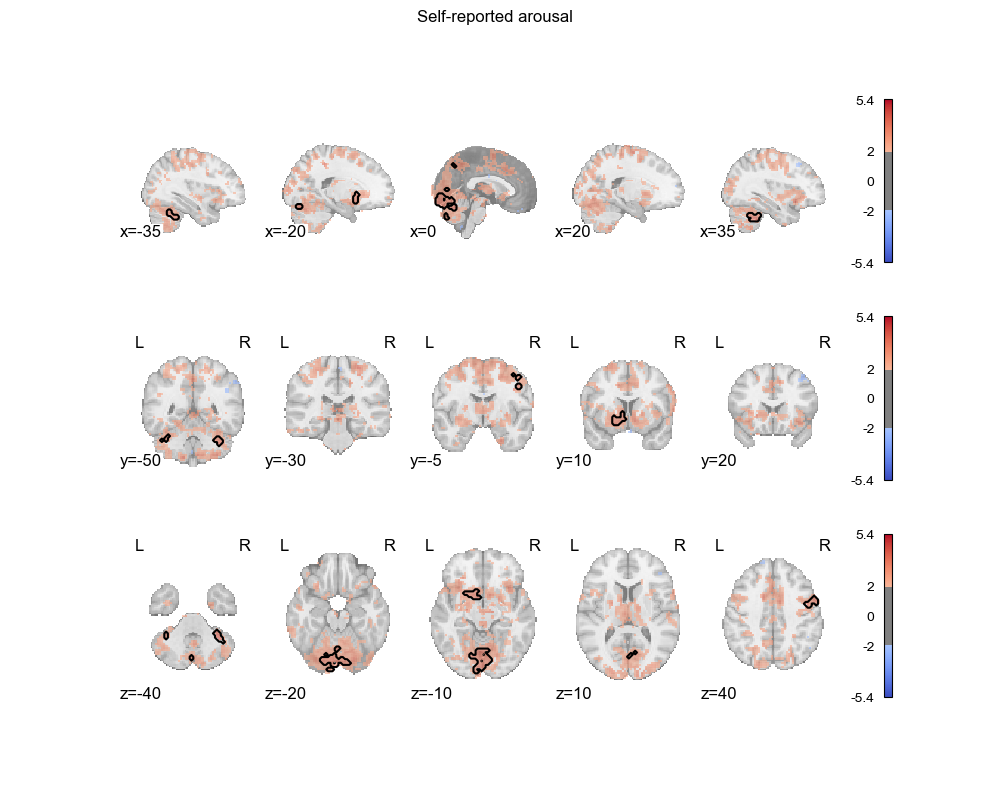

In [79]:
# Create figure and axes
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 8))
plt.rcParams['font.family'] = 'Arial'

# Define display modes and corresponding cut coordinates
modes_coords = [
    ("x", [-35, -20, 0, 20, 35]),
    ("y", [-50, -30, -5, 10, 20]),
    ("z", [-40, -20, -10, 10, 40])
]

# Loop across views
for i, (ax, (mode, coords)) in enumerate(zip(axes, modes_coords)):

    # --- 1. Main stat map (lower threshold + alpha) ---
    display = plotting.plot_stat_map(
        glm27_func_nii,
        display_mode=mode,
        cut_coords=coords,
        threshold=visualize_z_thresh,
        alpha=0.6,
        cmap='coolwarm',
        colorbar=True,
        vmin=-5.4,
        vmax=5.4,
        axes=ax
    )

    # --- 2. Cluster-extent thresholded contours ---
    filtered_img, _ = threshold_stats_img(
        glm27_func_nii,
        threshold=clustsim_z_thresh,
        height_control=None,
        cluster_threshold=clustsim_clust_thresh,
        two_sided=True
    )

    # Positive clusters
    display.add_contours(
        filtered_img,
        levels=[0.5],
        colors='black',
        linewidths=1.5
    )

    # Negative clusters
    display.add_contours(
        filtered_img,
        levels=[-0.5],
        colors='black',
        linewidths=1.5,
        linestyles='solid'
    )

    # Title on first row
    if i == 0:
        ax.set_title("Self-reported arousal",
                     fontsize=12,
                     color="black",
                     backgroundcolor="white")

# Finalize
plt.tight_layout()
plt.savefig('reported_arousal_SI.tiff', dpi=600, bbox_inches='tight')
plt.show()


/var/folders/q6/h8ld6fr92hj5v7s22m9q32rr0000gn/T/ipykernel_31236/1079658174.py:63: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


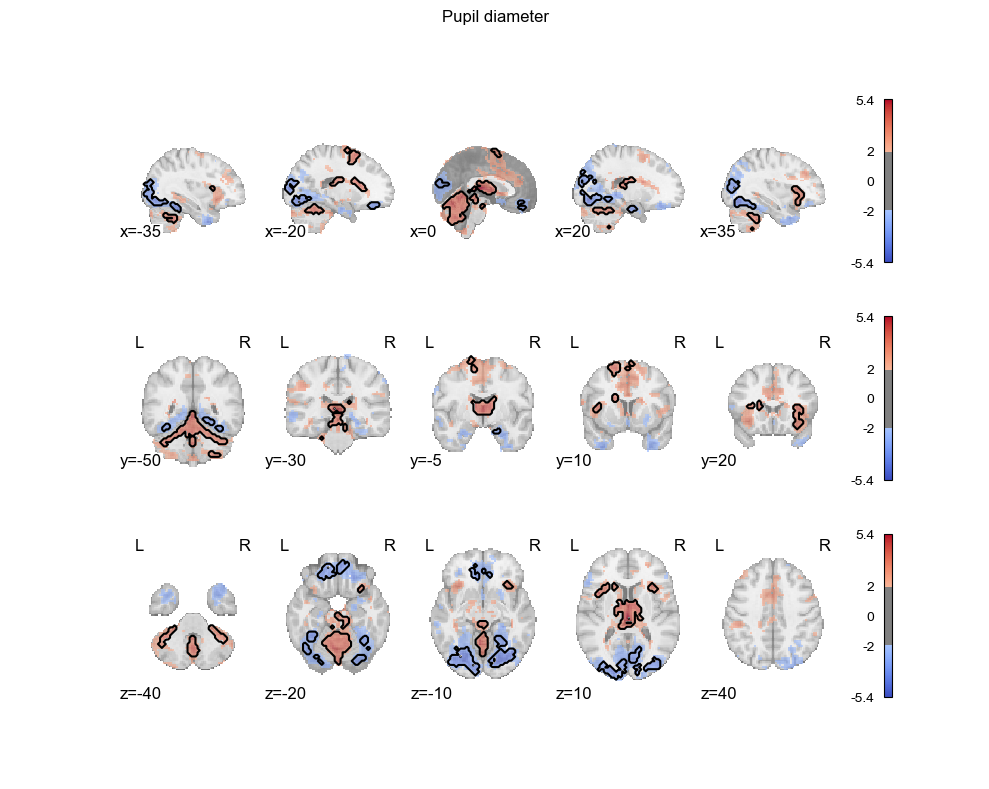

In [77]:
# Create figure and axes
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 8))
plt.rcParams['font.family'] = 'Arial'

# Define display modes and cut coordinates
modes_coords = [
    ("x", [-35, -20, 0, 20, 35]),
    ("y", [-50, -30, -5, 10, 20]),
    ("z", [-40, -20, -10, 10, 40])
]

# Loop over each view
for i, (ax, (mode, coords)) in enumerate(zip(axes, modes_coords)):

    # --- 1. Main map using lower threshold (visualize_z_thresh) ---
    display = plotting.plot_stat_map(
        glm33b_func_nii,
        display_mode=mode,
        cut_coords=coords,
        threshold=visualize_z_thresh,
        alpha=0.6,
        cmap='coolwarm',
        colorbar=True,
        vmax=5.4,
        vmin=-5.4,
        axes=ax
    )

    # --- 2. Cluster-extent thresholding for contours ---
    filtered_img, _ = threshold_stats_img(
        glm33b_func_nii,
        threshold=clustsim_z_thresh,
        height_control=None,
        cluster_threshold=clustsim_clust_thresh,
        two_sided=True
    )

    # Add black positive contours
    display.add_contours(
        filtered_img,
        levels=[0.5],
        colors='black',
        linewidths=1.5
    )

    # Add black negative contours
    display.add_contours(
        filtered_img,
        levels=[-0.5],
        colors='black',
        linewidths=1.5,
        linestyles='solid'
    )

    # Add title once for the first axis
    if i == 0:
        ax.set_title("Pupil diameter",
                     fontsize=12,
                     color="black",
                     backgroundcolor="white")

# Finalize
plt.tight_layout()
plt.savefig('pupil_SI.tiff', dpi=600, bbox_inches='tight')
plt.show()

# get fmri arousal index

## first, make the GLM templates (mask out occipital lobe for the pupil map)

[get_dataset_dir] Dataset found in /Users/yanyan/nilearn_data/yeo_2011


/var/folders/q6/h8ld6fr92hj5v7s22m9q32rr0000gn/T/ipykernel_89462/1104791135.py:11: FutureWarning: 'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.
  yeo_resampled = image.resample_to_img(yeo_img, glm33b_func_nii, interpolation='nearest')
/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/image/resampling.py:807: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  return resample_img(
/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_stat_map.py:208: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: 


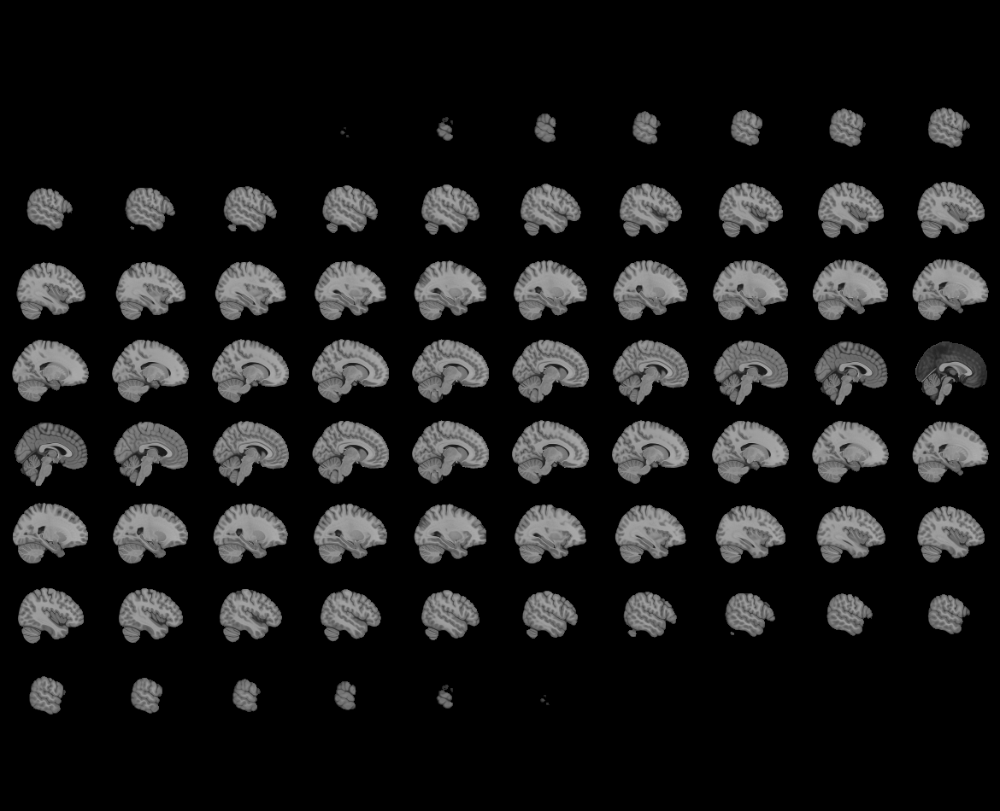
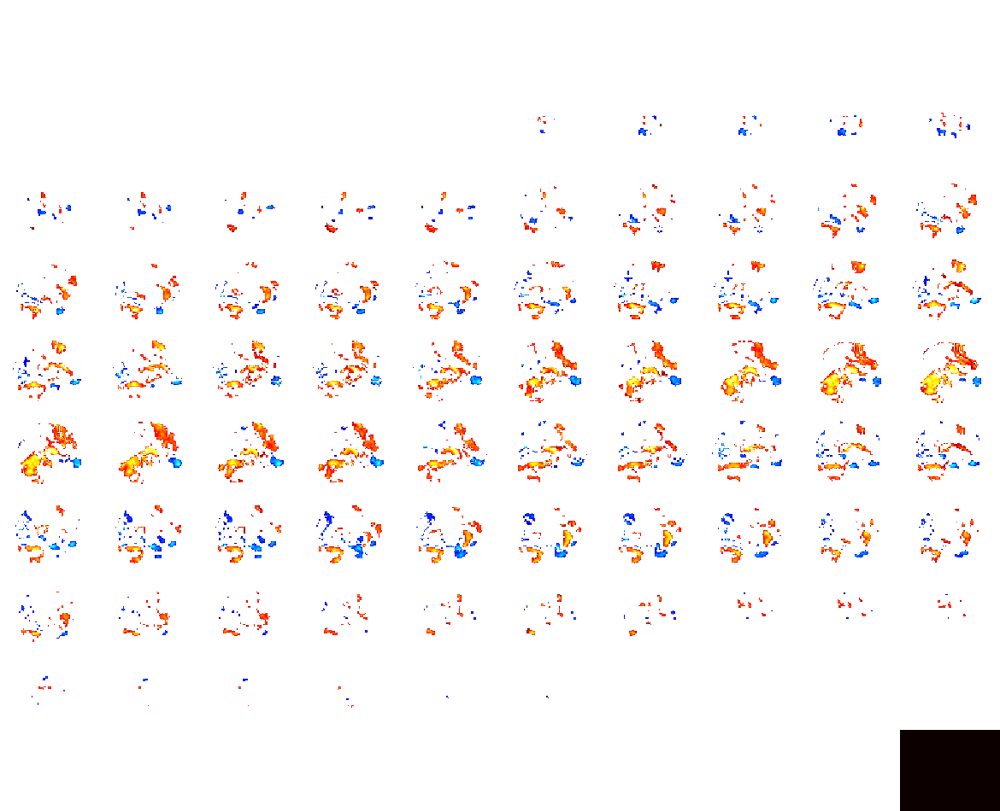

In [18]:
# --- Load Yeo atlas ---
atlas_yeo_2011 = datasets.fetch_atlas_yeo_2011()
yeo_img = nib.load(atlas_yeo_2011.thick_7)

# --- Load your functional data ---
glm33b_func_nii = nib.load('./model33b_pupil_scaled_convolved_24z.nii.gz')
glm33b_data = glm33b_func_nii.get_fdata()[:, :, :, 0, 1]   # extract the desired volume
glm_affine = glm33b_func_nii.affine

# --- Resample Yeo atlas into glm33b space (2.9 mm voxels) ---
yeo_resampled = image.resample_to_img(yeo_img, glm33b_func_nii, interpolation='nearest')
yeo_resampled_data = yeo_resampled.get_fdata()

# --- Make a binary mask for Visual Cortex (label = 1) ---
visual_mask = (yeo_resampled_data[:,:,:,0] == 1).astype(int)
gm_mask = nib.load("../rois/glm_mask_gm.nii.gz")
gm_mask_vol = gm_mask.get_fdata()

# # --- Mask out visual voxels in functional data ---
masked_glm33b = glm33b_data.copy()
masked_glm33b[visual_mask > 0] = np.nan
masked_glm33b[gm_mask_vol == 0] = np.nan
masked_glm33b_nii = nib.Nifti1Image(masked_glm33b, glm_affine)

# --- Plot ---
plotting.view_img(masked_glm33b_nii, threshold=2)


In [19]:

# # --- Mask out visual voxels in functional data ---
masked_glm33b_h1 = glm33b_h1_func_data.copy()
masked_glm33b_h1[visual_mask > 0] = np.nan
masked_glm33b_h1[gm_mask_vol == 0] = np.nan
masked_glm33b_h1_nii = nib.Nifti1Image(masked_glm33b_h1, glm_affine)

# --- Plot ---
plotting.view_img(masked_glm33b_h1_nii, threshold=2)

# # --- Mask out visual voxels in functional data ---
masked_glm33b_h2 = glm33b_h2_func_data.copy()
masked_glm33b_h2[visual_mask > 0] = np.nan
masked_glm33b_h2[gm_mask_vol == 0] = np.nan
masked_glm33b_h2_nii = nib.Nifti1Image(masked_glm33b_h2, glm_affine)

# --- Plot ---
plotting.view_img(masked_glm33b_h2_nii, threshold=2)

masked_glm33b_h1_corr = masked_glm33b_h1.copy()
masked_glm33b_h2_corr = masked_glm33b_h2.copy()
masked_glm33b_h1_corr[abs(masked_glm33b_h1) < 0.5] = np.nan
masked_glm33b_h2_corr[abs(masked_glm33b_h2) < 0.5] = np.nan

/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_stat_map.py:208: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_stat_map.py:208: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_stat_map.py:208: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



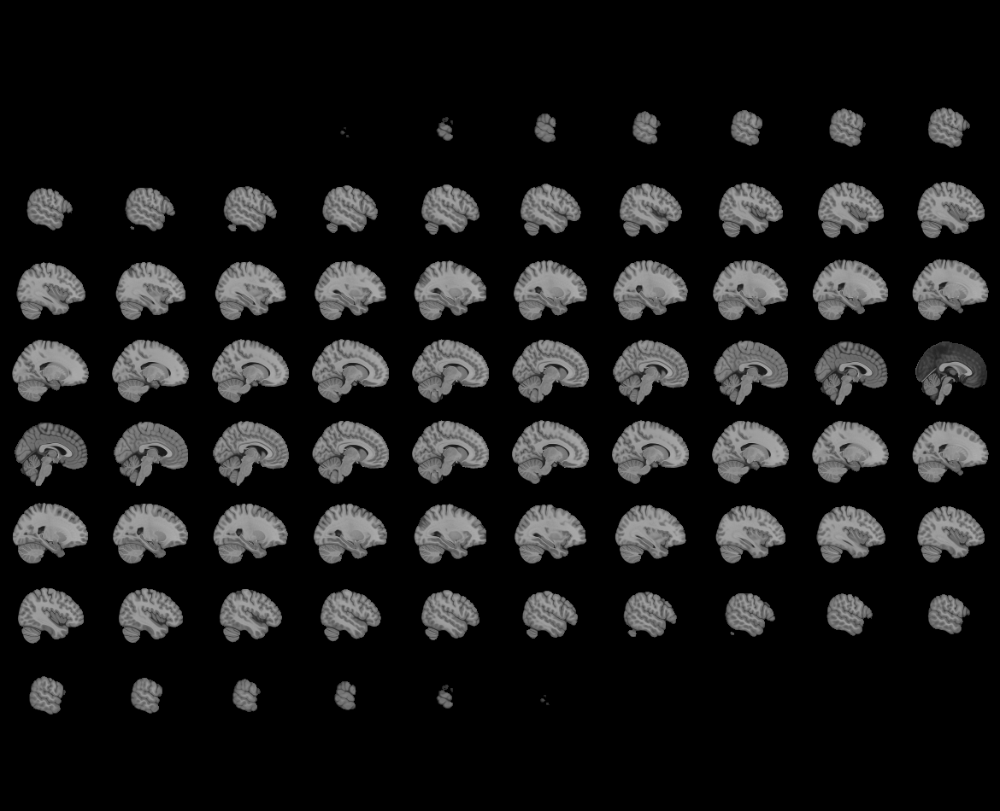
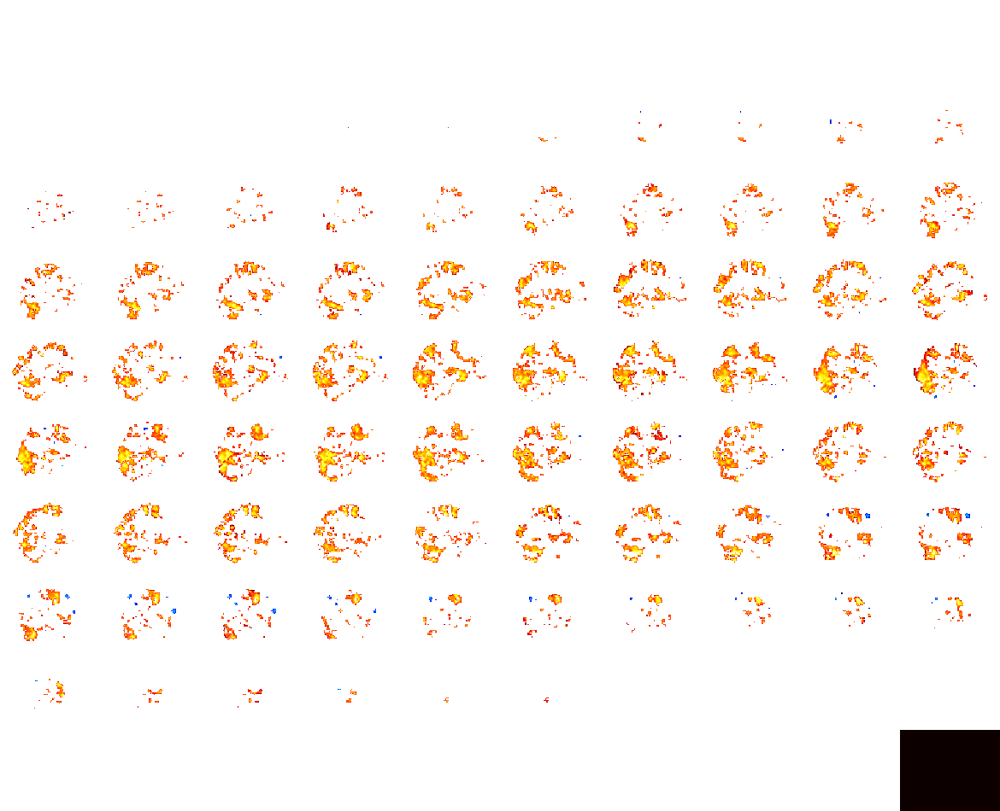

In [20]:
# # --- Mask out visual voxels in functional data ---
glm27_func_nii = nib.load('./model27c_param_arous_early_30z.nii.gz')
glm27_func_data = glm27_func_nii.get_fdata()[:, :, :, 0, 1]   # extract the desired volume
glm_affine = glm33b_func_nii.affine
masked_glm27 = glm27_func_data.copy()
masked_glm27[gm_mask_vol == 0] = np.nan
masked_glm27_nii = nib.Nifti1Image(masked_glm27, glm_affine)

# --- Plot ---
plotting.view_img(masked_glm27_nii, threshold=2)

/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_stat_map.py:208: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



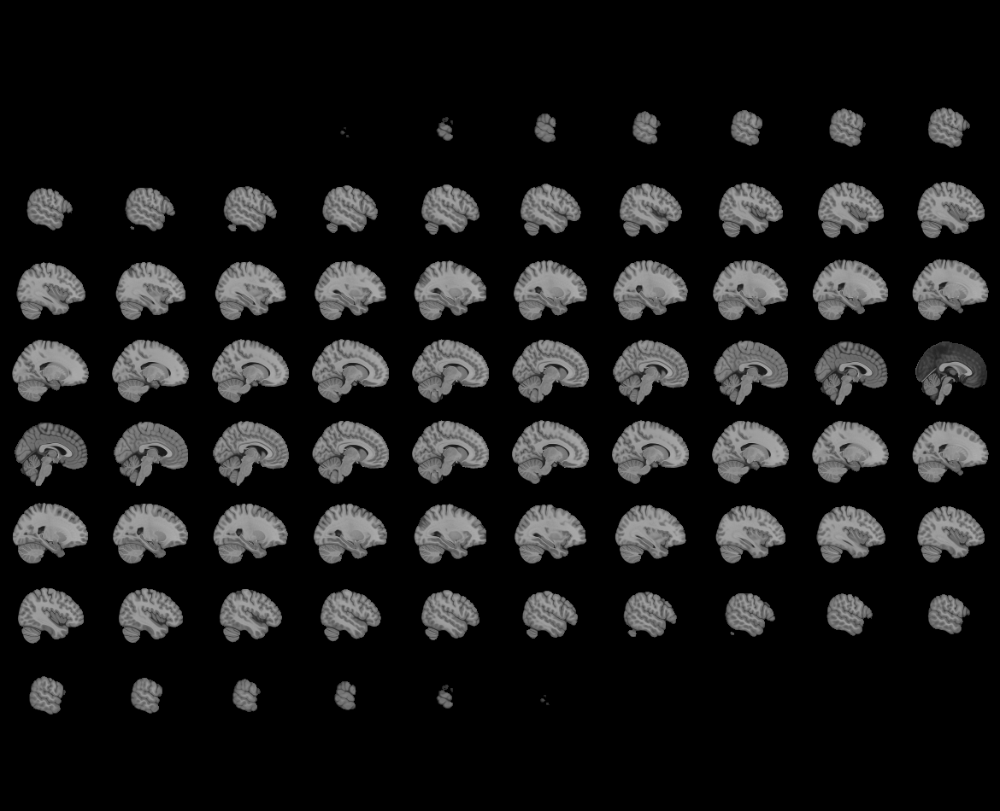
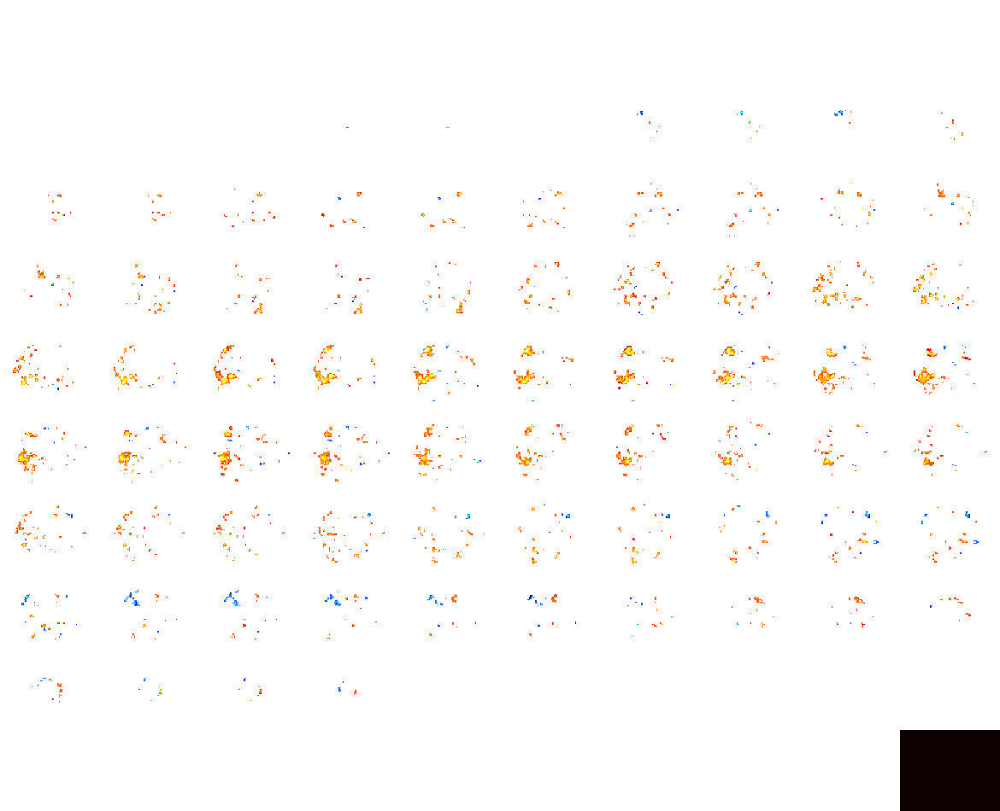

In [21]:
masked_glm27c_h1 = glm27c_h1_func_data.copy()
masked_glm27c_h1[gm_mask_vol == 0] = np.nan
masked_glm27c_h1_nii = nib.Nifti1Image(masked_glm27c_h1, glm_affine)

# --- Plot ---
plotting.view_img(masked_glm27c_h1_nii, threshold=2)

/Users/yanyan/miniforge3/lib/python3.10/site-packages/nilearn/plotting/html_stat_map.py:208: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  data = safe_get_data(stat_map_img, ensure_finite=True)
/Users/yanyan/miniforge3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



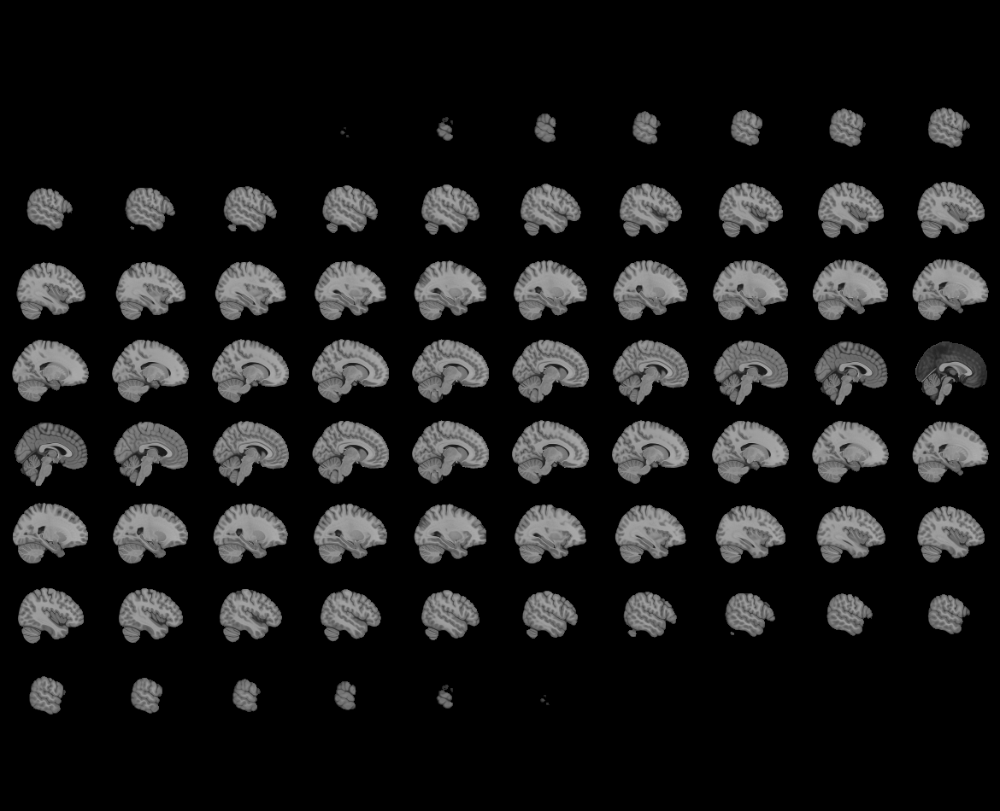
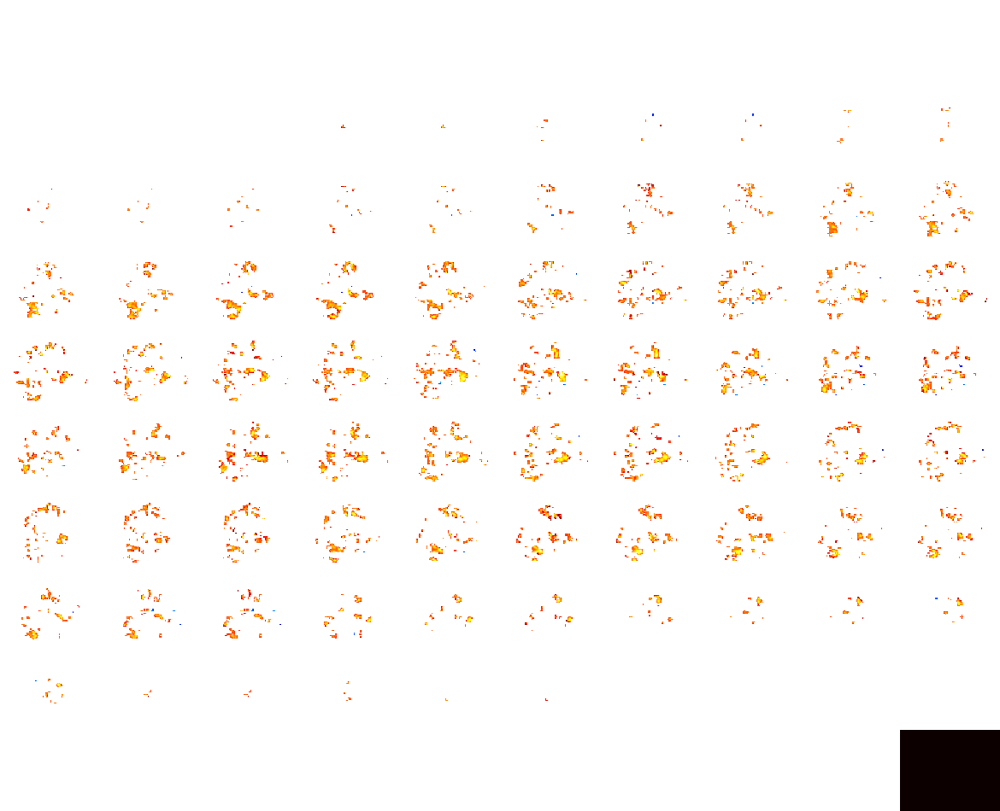

In [22]:
masked_glm27c_h2 = glm27c_h2_func_data.copy()
masked_glm27c_h2[gm_mask_vol == 0] = np.nan
masked_glm27c_h2_nii = nib.Nifti1Image(masked_glm27c_h2, glm_affine)

# --- Plot ---
plotting.view_img(masked_glm27c_h2_nii, threshold=2)

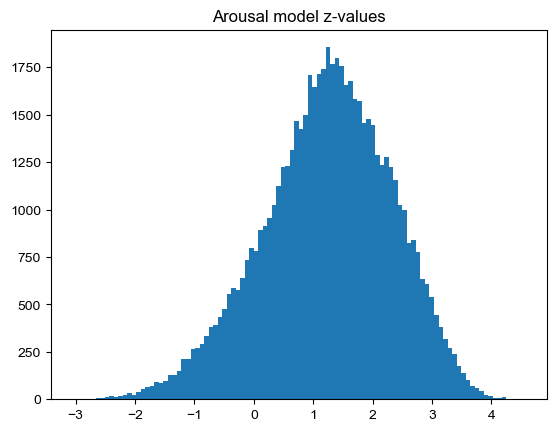

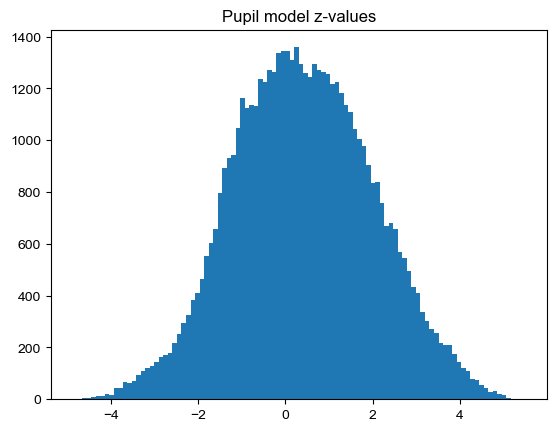

In [21]:
import matplotlib.pyplot as plt

plt.hist(masked_glm27[masked_glm27 != 0].ravel(), bins=100)
plt.title("Arousal model z-values")
plt.show()

plt.hist(masked_glm33b[masked_glm33b != 0].ravel(), bins=100)
plt.title("Pupil model z-values")
plt.show()



In [22]:
# Directory containing the NIfTI files
nifti_dir = '../bold_data/data/'

# read in downsampled pupil
pupil_dir = '../analyses/pupil/glm_regs/'

with open('../analyses/subjects-pupil-fmri.txt', 'r') as file:
    included_subjects = set(line.strip() for line in file)
len(included_subjects)

24

In [104]:
file_pattern = os.path.join(pupil_dir, '*scaled.1D')
files = sorted(glob.glob(file_pattern))
filtered_files = [
    f for f in files
    if os.path.basename(f).split('_')[0] in included_subjects
]

pupil_array = []

for f in filtered_files:
    my_array = np.loadtxt(f)
    pupil_array.append(my_array)
# my_array = np.loadtxt(files[3])

pupil_array = np.vstack(pupil_array)
pupil_array.shape
np.savetxt("pupil_array.csv", pupil_array, delimiter=",", fmt="%f")

In [23]:
# read functional fmri data
# 1. Organize and Sort Files
# Assuming files are named as subject_glm37_z_b2_mni_[0-2].nii.gz
file_pattern = os.path.join(nifti_dir, '*_b4_mni_ants.nii.gz')
files = sorted(glob.glob(file_pattern))

filtered_files = [
    f for f in files
    if os.path.basename(f).split('_')[0] in included_subjects
]

subject_ids = [os.path.basename(f).split('_')[0] for f in filtered_files]
subject_files = {}
for f in files:
    basename = os.path.basename(f)
    subject_id = basename.split('_')[0]  # Extract the subject ID
    if subject_id in included_subjects:
        if subject_id not in subject_files:
            subject_files[subject_id] = []
        subject_files[subject_id].append(f)
len(subject_ids)
subject_files

{'ab240324': ['../bold_data/data/ab240324_b4_mni_ants.nii.gz'],
 'ag240330': ['../bold_data/data/ag240330_b4_mni_ants.nii.gz'],
 'ak240314': ['../bold_data/data/ak240314_b4_mni_ants.nii.gz'],
 'am240301': ['../bold_data/data/am240301_b4_mni_ants.nii.gz'],
 'av240312': ['../bold_data/data/av240312_b4_mni_ants.nii.gz'],
 'ax240308': ['../bold_data/data/ax240308_b4_mni_ants.nii.gz'],
 'by240324': ['../bold_data/data/by240324_b4_mni_ants.nii.gz'],
 'ch240307': ['../bold_data/data/ch240307_b4_mni_ants.nii.gz'],
 'dm240321': ['../bold_data/data/dm240321_b4_mni_ants.nii.gz'],
 'ek240304': ['../bold_data/data/ek240304_b4_mni_ants.nii.gz'],
 'gy240322': ['../bold_data/data/gy240322_b4_mni_ants.nii.gz'],
 'ig240319': ['../bold_data/data/ig240319_b4_mni_ants.nii.gz'],
 'jz240308': ['../bold_data/data/jz240308_b4_mni_ants.nii.gz'],
 'lb240324': ['../bold_data/data/lb240324_b4_mni_ants.nii.gz'],
 'll240312': ['../bold_data/data/ll240312_b4_mni_ants.nii.gz'],
 'mc240228': ['../bold_data/data/mc24022

In [24]:
# concatenated_img = image.concat_imgs(subject_files['ab240324'])
# concatenated_img = concatenated_img.get_fdata()
# glm33_func_data.shape
# concatenated_img.shape

# function
def calculate_similarity_time_series(concatenated_img, template_img):
    # Reshape template image to 1D
    template_flat = template_img.flatten()
    
    # Get the number of time points (last dimension of concatenated_img)
    num_time_points = concatenated_img.shape[-1]
    
    # Initialize similarity time series
    similarity_time_series = np.zeros(num_time_points)
    
    for t in range(num_time_points):
        # Extract the t-th volume and flatten it
        volume_flat = concatenated_img[..., t].flatten()
        
        # Calculate Pearson correlation between template and volume
        similarity, _ = spearmanr(template_flat, volume_flat,nan_policy='omit') #pearsonr(template_flat, volume_flat)
        similarity_time_series[t] = similarity
    
    return similarity_time_series

In [107]:
thresholds = [0,0.5, 1, 1.5, 2, 2.5, 3, 3.5]

for thresh in thresholds:
    print(f"\n=== Processing threshold {thresh} ===")
    
    # Apply threshold (make a copy so the original data isn't modified)
    glm27_func_thresh = masked_glm27.copy()
    glm27_func_thresh[glm27_func_thresh < thresh] = np.nan
    
    similarity_time_series = []
    
    for subject_id, subject_file in subject_files.items():
        print('processing', subject_id)
        concatenated_img = image.concat_imgs(subject_file)
        concatenated_img = concatenated_img.get_fdata()
        
        similarity_idx = calculate_similarity_time_series(concatenated_img, glm27_func_thresh)
        similarity_time_series.append(similarity_idx)
        
        del concatenated_img  # free memory
    
    glm27_similarity_time_series_stacked = np.vstack(similarity_time_series)
    
    # Save to CSV with threshold label (e.g., threshold05, threshold10, etc.)
    out_name = f"glm27_array_threshold{str(thresh).replace('.', '')}.csv"
    np.savetxt(out_name, glm27_similarity_time_series_stacked, delimiter=",", fmt="%f")
    print(f"Saved {out_name}")


=== Processing threshold 0 ===
processing ab240324
processing ag240330
processing ak240314
processing am240301
processing av240312
processing ax240308
processing by240324
processing ch240307
processing dm240321
processing ek240304
processing gy240322
processing ig240319
processing jz240308
processing lb240324
processing ll240312
processing mc240228
processing nq240330
processing pm240301
processing rc240308
processing sg240304
processing sp240228
processing ya240314
processing yl240330
processing yz240312
Saved glm27_array_threshold0.csv

=== Processing threshold 0.5 ===
processing ab240324
processing ag240330
processing ak240314
processing am240301
processing av240312
processing ax240308
processing by240324
processing ch240307
processing dm240321
processing ek240304
processing gy240322
processing ig240319
processing jz240308
processing lb240324
processing ll240312
processing mc240228
processing nq240330
processing pm240301
processing rc240308
processing sg240304
processing sp240228
p


=== Processing threshold 0 ===
processing ab240324
processing ag240330
processing ak240314
processing am240301
processing av240312
processing ax240308
processing by240324
processing ch240307
processing dm240321
processing ek240304
processing gy240322
processing ig240319
processing jz240308
processing lb240324
processing ll240312
processing mc240228
processing nq240330
processing pm240301
processing rc240308
processing sg240304
processing sp240228
processing ya240314
processing yl240330
processing yz240312
Saved glm33b_array_threshold0.csv

=== Processing threshold 0.5 ===
processing ab240324
processing ag240330
processing ak240314
processing am240301
processing av240312
processing ax240308
processing by240324
processing ch240307
processing dm240321
processing ek240304
processing gy240322
processing ig240319
processing jz240308
processing lb240324
processing ll240312
processing mc240228
processing nq240330
processing pm240301
processing rc240308
processing sg240304
processing sp240228


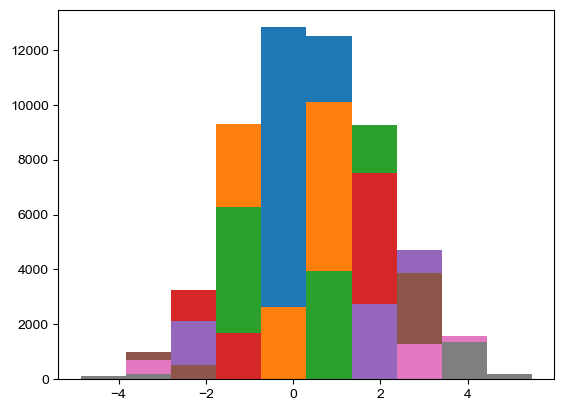

In [108]:
thresholds = [0,0.5, 1, 1.5, 2, 2.5, 3, 3.5]

for thresh in thresholds:
    print(f"\n=== Processing threshold {thresh} ===")
    
    # Apply threshold (make a copy so the original data isn't modified)
    glm33b_func_thresh = masked_glm33b.copy()
    glm33b_func_thresh[abs(glm33b_func_thresh) < thresh] = np.nan

    plt.hist(glm33b_func_thresh.flatten())
    
    similarity_time_series = []
    
    for subject_id, subject_file in subject_files.items():
        print('processing', subject_id)
        concatenated_img = image.concat_imgs(subject_file)
        concatenated_img = concatenated_img.get_fdata()
        
        similarity_idx = calculate_similarity_time_series(concatenated_img, glm33b_func_thresh)
        similarity_time_series.append(similarity_idx)
        
        del concatenated_img  # free memory
    
    glm33b_similarity_time_series_stacked = np.vstack(similarity_time_series)
    
    # Save to CSV with threshold label (e.g., threshold05, threshold10, etc.)
    out_name = f"glm33b_array_threshold{str(thresh).replace('.', '')}.csv"
    np.savetxt(out_name, glm33b_similarity_time_series_stacked, delimiter=",", fmt="%f")
    print(f"Saved {out_name}")


=== Processing threshold 0 ===
processing ab240324
processing ag240330
processing ak240314
processing am240301
processing av240312
processing ax240308
processing by240324
processing ch240307
processing dm240321
processing ek240304
processing gy240322
processing ig240319
processing jz240308
processing lb240324
processing ll240312
processing mc240228
processing nq240330
processing pm240301
processing rc240308
processing sg240304
processing sp240228
processing ya240314
processing yl240330
processing yz240312
Saved glm33b_posonly_array_threshold0.csv

=== Processing threshold 0.5 ===
processing ab240324
processing ag240330
processing ak240314
processing am240301
processing av240312
processing ax240308
processing by240324
processing ch240307
processing dm240321
processing ek240304
processing gy240322
processing ig240319
processing jz240308
processing lb240324
processing ll240312
processing mc240228
processing nq240330
processing pm240301
processing rc240308
processing sg240304
processing s

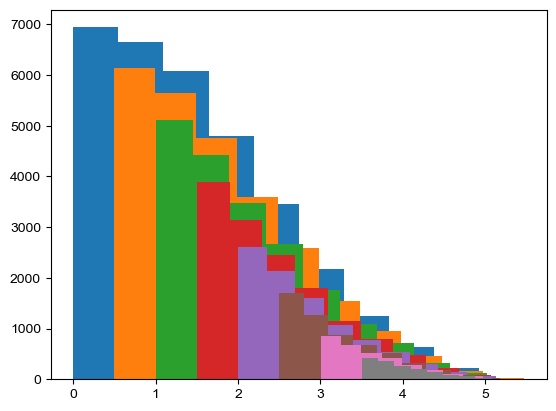

In [109]:
thresholds = [0,0.5, 1, 1.5, 2, 2.5, 3, 3.5]

for thresh in thresholds:
    print(f"\n=== Processing threshold {thresh} ===")
    
    # Apply threshold (make a copy so the original data isn't modified)
    glm33b_func_thresh = masked_glm33b.copy()
    glm33b_func_thresh[glm33b_func_thresh < thresh] = np.nan

    plt.hist(glm33b_func_thresh.flatten())
    
    similarity_time_series = []
    
    for subject_id, subject_file in subject_files.items():
        print('processing', subject_id)
        concatenated_img = image.concat_imgs(subject_file)
        concatenated_img = concatenated_img.get_fdata()
        
        similarity_idx = calculate_similarity_time_series(concatenated_img, glm33b_func_thresh)
        similarity_time_series.append(similarity_idx)
        
        del concatenated_img  # free memory
    
    glm33b_similarity_time_series_stacked = np.vstack(similarity_time_series)
    
    # Save to CSV with threshold label (e.g., threshold05, threshold10, etc.)
    out_name = f"glm33b_posonly_array_threshold{str(thresh).replace('.', '')}.csv"
    np.savetxt(out_name, glm33b_similarity_time_series_stacked, delimiter=",", fmt="%f")
    print(f"Saved {out_name}")

In [ ]:
thresholds = [0,0.5, 1, 1.5, 2, 2.5, 3, 3.5]

for thresh in thresholds:
    print(f"\n=== Processing threshold {thresh} ===")
    
    # Apply threshold (make a copy so the original data isn't modified)
    glm33b_func_thresh = masked_glm33b_h1.copy()
    glm33b_func_thresh[abs(glm33b_func_thresh) < thresh] = np.nan

    # plt.hist(glm33b_func_thresh.flatten())
    
    similarity_time_series = []
    
    for subject_id, subject_file in subject_files.items():
        print('processing', subject_id)
        concatenated_img = image.concat_imgs(subject_file)
        concatenated_img = concatenated_img.get_fdata()

        # Take volumes 490–980
        concatenated_img = concatenated_img[..., 490:980]
        
        similarity_idx = calculate_similarity_time_series(concatenated_img, glm33b_func_thresh)
        similarity_time_series.append(similarity_idx)
        
        del concatenated_img  # free memory
    
    glm33b_similarity_time_series_stacked = np.vstack(similarity_time_series)
    
    # Save to CSV with threshold label (e.g., threshold05, threshold10, etc.)
    out_name = f"glm33b_h1_array_threshold{str(thresh).replace('.', '')}.csv"
    np.savetxt(out_name, glm33b_similarity_time_series_stacked, delimiter=",", fmt="%f")
    print(f"Saved {out_name}")

In [ ]:
thresholds = [0,0.5, 1, 1.5, 2, 2.5, 3, 3.5]

for thresh in thresholds:
    print(f"\n=== Processing threshold {thresh} ===")
    
    # Apply threshold (make a copy so the original data isn't modified)
    glm33b_func_thresh = masked_glm33b_h2.copy()
    glm33b_func_thresh[abs(glm33b_func_thresh) < thresh] = np.nan

    # plt.hist(glm33b_func_thresh.flatten())
    
    similarity_time_series = []
    
    for subject_id, subject_file in subject_files.items():
        print('processing', subject_id)
        concatenated_img = image.concat_imgs(subject_file)
        concatenated_img = concatenated_img.get_fdata()

        # Take volumes 490–980
        concatenated_img = concatenated_img[..., 0:490]
        
        similarity_idx = calculate_similarity_time_series(concatenated_img, glm33b_func_thresh)
        similarity_time_series.append(similarity_idx)
        
        del concatenated_img  # free memory
    
    glm33b_similarity_time_series_stacked = np.vstack(similarity_time_series)
    
    # Save to CSV with threshold label (e.g., threshold05, threshold10, etc.)
    out_name = f"glm33b_h2_array_threshold{str(thresh).replace('.', '')}.csv"
    np.savetxt(out_name, glm33b_similarity_time_series_stacked, delimiter=",", fmt="%f")
    print(f"Saved {out_name}")

In [ ]:
thresholds = [0,0.5, 1, 1.5, 2, 2.5, 3, 3.5]

for thresh in thresholds:
    print(f"\n=== Processing threshold {thresh} ===")
    
    # Apply threshold (make a copy so the original data isn't modified)
    glm27c_func_thresh = masked_glm27c_h1.copy()
    glm27c_func_thresh[abs(glm27c_func_thresh) < thresh] = np.nan

    # plt.hist(glm33b_func_thresh.flatten())
    
    similarity_time_series = []
    
    for subject_id, subject_file in subject_files.items():
        print('processing', subject_id)
        concatenated_img = image.concat_imgs(subject_file)
        concatenated_img = concatenated_img.get_fdata()

        # Take volumes 490–980
        concatenated_img = concatenated_img[..., 490:980]
        
        similarity_idx = calculate_similarity_time_series(concatenated_img, glm27c_func_thresh)
        similarity_time_series.append(similarity_idx)
        
        del concatenated_img  # free memory
    
    glm33b_similarity_time_series_stacked = np.vstack(similarity_time_series)
    
    # Save to CSV with threshold label (e.g., threshold05, threshold10, etc.)
    out_name = f"glm27c_h1_array_threshold{str(thresh).replace('.', '')}.csv"
    np.savetxt(out_name, glm33b_similarity_time_series_stacked, delimiter=",", fmt="%f")
    print(f"Saved {out_name}")


for thresh in thresholds:
    print(f"\n=== Processing threshold {thresh} ===")
    
    # Apply threshold (make a copy so the original data isn't modified)
    glm27c_func_thresh = masked_glm27c_h2.copy()
    glm27c_func_thresh[abs(glm27c_func_thresh) < thresh] = np.nan

    # plt.hist(glm33b_func_thresh.flatten())
    
    similarity_time_series = []
    
    for subject_id, subject_file in subject_files.items():
        print('processing', subject_id)
        concatenated_img = image.concat_imgs(subject_file)
        concatenated_img = concatenated_img.get_fdata()

        # Take volumes 490–980
        concatenated_img = concatenated_img[..., 0:490]
        
        similarity_idx = calculate_similarity_time_series(concatenated_img, glm27c_func_thresh)
        similarity_time_series.append(similarity_idx)
        
        del concatenated_img  # free memory
    
    glm33b_similarity_time_series_stacked = np.vstack(similarity_time_series)
    
    # Save to CSV with threshold label (e.g., threshold05, threshold10, etc.)
    out_name = f"glm27c_h2_array_threshold{str(thresh).replace('.', '')}.csv"
    np.savetxt(out_name, glm33b_similarity_time_series_stacked, delimiter=",", fmt="%f")
    print(f"Saved {out_name}")

In [14]:
def cosine_similarity(a, b):
    dot_product = np.dot(a, b)
    norm_a = np.linalg.norm(a)
    norm_b = np.linalg.norm(b)
    return dot_product / (norm_a * norm_b)

def cor(a, b):
    # Reshape template image to 1D
    a = a.flatten()
    b = b.flatten()

    mask = ~np.isnan(a) & ~np.isnan(b)
    result = spearmanr(a[mask], b[mask])
    # plt.plot(a[mask], b[mask],'.')
    # result=result[0,1]
    return result.correlation

In [25]:
print("pupil split 1 vs. 2:",cor(masked_glm33b_h1_corr,masked_glm33b_h2_corr))
print("self-report split 1 vs. 2:",cor(glm27c_h1_func_data,glm27c_h2_func_data))
print("pupil vs. arousal 1:",cor(masked_glm33b_h1_corr,glm27c_h1_func_data))
print("pupil vs. arousal 2:",cor(masked_glm33b_h2_corr,glm27c_h2_func_data))

pupil split 1 vs. 2: 0.7741833244262595
self-report split 1 vs. 2: 0.2953090061307461
pupil vs. arousal 1: 0.22293324388678076
pupil vs. arousal 2: 0.2311120583748291


In [8]:
## calc pattern similarity
result1 = cor(glm33b_func_data, glm27_func_data)
print("subjective arousal vs. pupil:", result1)

# Calculate correlation
result6 = cor(hesse2017_func_data, ding2010_func_data)
print("NE (Ding) vs. NE (Hesse):", result6)

# ## pupil map vs. NE map
result2 = cor(glm33b_func_data, hesse2017_func_data)
print("pupil vs. NE (Hesse):", result2)

result3 = cor(glm33b_func_data, ding2010_func_data)
print("pupil vs. NE (Ding):", result3)

result4 = cor(glm27_func_data, hesse2017_func_data)
print("subjective arousal vs. NE (Hesse):", result4)

result5= cor(glm27_func_data, ding2010_func_data)
print("subjective arousal vs. NE (Ding):", result5)

result6= cor(glm33b_func_data_conj, glm33b_func_data)

result7= cor(glm33b_func_data_conj, glm27_func_data)

result8= cor(glm33b_func_data_conj, ding2010_func_data)

subjective arousal vs. pupil: 0.18437478544540306


NameError: name 'hesse2017_func_data' is not defined

In [166]:
result6

0.2821395045960846

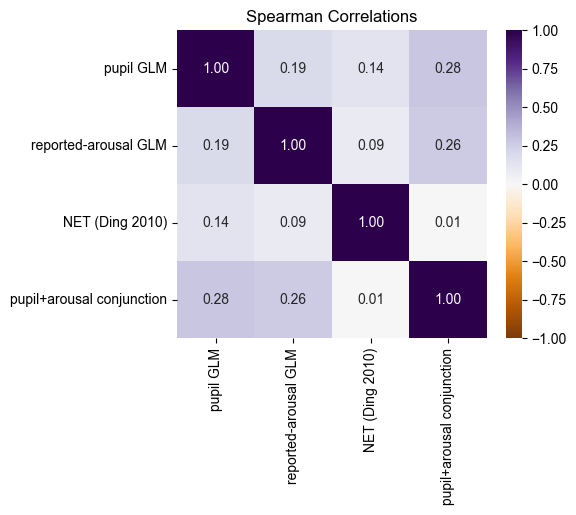

In [131]:
# Example correlation results
data = {
    "pupil GLM": [1, result1, result3,result6],
    "reported-arousal GLM": [result1, 1, result5,result7],
    "NET (Ding 2010)": [result3, result5, 1,result8],
    "pupil+arousal conjunction": [result6, result7, result8,1],
}

# Convert to a DataFrame for better labeling
correlation_matrix = pd.DataFrame(data, index=data.keys())

# Create the heatmap
plt.figure(figsize=(5, 4))
plt.rcParams['font.family'] = 'Arial'
sns.heatmap(correlation_matrix, cmap='PuOr',annot=True,vmin=-1,vmax=1, fmt=".2f")
plt.title("Spearman Correlations")
plt.savefig('glm_fig_corr.tiff', dpi=600,bbox_inches='tight')
plt.show()
